In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
#!pip install opencv-python
#!pip install torch torchvision
import numpy as np
import imageio as io
import math
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import random
import cv2
from scipy import ndimage
from torch.autograd import Variable
import sys
import os
from torchvision import datasets, transforms
from torch.utils.data import Dataset
from torch.autograd import Function, Variable


cuda = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(5)
torch.cuda.manual_seed(5)

In [0]:
!mkdir -p pet_data
!wget https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz -O pet_data/images.tar.gz
!wget https://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz -O pet_data/annotations.tar.gz
!cd pet_data && tar -xf images.tar.gz && tar -xf annotations.tar.gz

--2019-10-31 14:40:39--  https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 791918971 (755M) [application/x-gzip]
Saving to: ‘pet_data/images.tar.gz’

pet_data/images.tar 100%[===================>] 755.23M  65.0MB/s    in 14s     

2019-10-31 14:40:53 (53.1 MB/s) - ‘pet_data/images.tar.gz’ saved [791918971/791918971]

--2019-10-31 14:40:55--  https://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19173078 (18M) [application/x-gzip]
Saving to: ‘pet_data/annotations.tar.gz’

pet_data/annotation 100%[===================>]  18.28M  64.4MB/s    in 0.3s    



In [0]:
#!ls pet_data
!rm pet_data/annotations/trimaps/._*
!rm pet_data/annotations/trimaps/[ABCDEFGHIJKLMNOPQRSTUVWXYZ]*
!rm pet_data/images/[ABCDEFGHIJKLMNOPQRSTUVWXYZ]*

!mkdir pet_data/masks
!mv pet_data/annotations/trimaps/* pet_data/masks


In [0]:
def Transform(sample):
  image = sample['image']
  mask = sample['mask']

  to_PIL = transforms.ToPILImage()
  image = to_PIL(image)
  mask = to_PIL(mask)

  resize = transforms.Resize((128, 128))
  image = resize(image)
  mask = resize(mask)

  to_tensor = transforms.ToTensor()
  image = to_tensor(image)
  mask = to_tensor(mask)

  return {'image': image, 'mask' : mask}

In [0]:

class CustomData(Dataset):
    def __init__(self, root_dir, offset, image_prefix, mask_prefix, transform=None):
        self.root_dir = root_dir
        self.offset = offset
        self.image_prefix = image_prefix
        self.mask_prefix = mask_prefix
        self.transform = transform
        self.storage = {}

    def __len__(self):
        return len(os.listdir(self.root_dir + "input/"))

    def __getitem__(self, idx):
        if idx not in self.storage:
          img_name = self.root_dir + self.image_prefix + str(self.offset + idx) + ".jpg"
          image = io.imread(img_name)
          
          mask_name = self.root_dir + self.mask_prefix + str(self.offset + idx) + ".jpg"
          mask = io.imread(mask_name)

          self.storage[idx] = {'image': image, 'mask': mask}

        sample = self.storage[idx]

        if self.transform:
            sample = self.transform(sample)

        return sample

In [0]:
torch.manual_seed(21238)
torch.cuda.manual_seed(21)
random.seed(32)
transform = transforms.Compose([Transform])

trainset = CustomData("/content/drive/My Drive/Colab Notebooks/cat_data/Train/", 0, "input/cat.", "mask/mask_cat.", transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=10, shuffle=True)


testset = CustomData("/content/drive/My Drive/Colab Notebooks/cat_data/Test/", 60, "input/cat.", "mask/mask_cat.", transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=1, shuffle=True)



In [0]:
class Conv2Layer(nn.Module):
  def __init__(self, inChan, outChan):
    super(Conv2Layer, self).__init__()

    self.features = nn.Sequential(
        nn.Conv2d(inChan, outChan, kernel_size=3, stride=1, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(outChan, outChan, kernel_size=3, stride=1, padding=1),
        nn.ReLU(inplace=True),
    )

  def forward(self, x):
    x = self.features(x)

    return x

class Conv2Layer(nn.Module):
  def __init__(self, inChan, outChan):
    super(Conv2Layer, self).__init__()

    self.features = nn.Sequential(
        nn.Conv2d(inChan, outChan, kernel_size=3, stride=1, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(outChan, outChan, kernel_size=3, stride=1, padding=1),
        nn.ReLU(inplace=True),
    )

  def forward(self, x):
    x = self.features(x)

    return x

class downSample(nn.Module):
  def __init__(self):
    super(downSample, self).__init__()

    self.features = nn.Sequential(
        #Conv2Layer(inChan, outChan),
        nn.MaxPool2d(kernel_size=2, stride=2),
    )

  def forward(self, x):
    x = self.features(x)
    return x

class upSample(nn.Module):
  def __init__(self, inChan, outChan):
    super(upSample, self).__init__()

    self.features = nn.Sequential(
        #Conv2Layer(inChan, outChan),
        nn.ConvTranspose2d(inChan, outChan, kernel_size=3, stride=2, padding=1, output_padding=1),
    )

  def forward(self, x):
    x = self.features(x)
    return x



class UNet(nn.Module):
  def __init__(self, inDim, layerDim):
    super(UNet, self).__init__()

    self.convDown1 = Conv2Layer(inDim, layerDim)
    self.down = downSample()
    layerDim1 = 2 * layerDim
    self.convDown2 = Conv2Layer(layerDim, layerDim1)
    layerDim2 = 2 * layerDim1
    self.convDown3 = Conv2Layer(layerDim1, layerDim2)
    layerDim3 = 2 * layerDim2
    self.convDown4 = Conv2Layer(layerDim2, layerDim3)

    layerDim4 = 2 * layerDim3
    self.convUp1 = Conv2Layer(layerDim3, layerDim4)
    self.up1 = upSample(layerDim4, layerDim3)
    self.convUp2 = Conv2Layer(layerDim4, layerDim3)
    self.up2 = upSample(layerDim3, layerDim2)
    self.convUp3 = Conv2Layer(layerDim3, layerDim2)
    self.up3 = upSample(layerDim2, layerDim1)
    self.convUp4 = Conv2Layer(layerDim2, layerDim1)
    self.up4 = upSample(layerDim1, layerDim)
    self.conv2L = Conv2Layer(layerDim1, layerDim)

    self.output = nn.Sequential(
        nn.Conv2d(layerDim, 1, 1),
        nn.Sigmoid()
    )

  def forward(self, x):
    xd1 = self.convDown1(x)
    xd11 = self.down(xd1)
    xd2 = self.convDown2(xd11)
    xd21 = self.down(xd2)
    xd3 = self.convDown3(xd21)
    xd31 = self.down(xd3)
    xd4 = self.convDown4(xd31)
    xd41 = self.down(xd4)

    xu1 = self.convUp1(xd41)
    xu11 = self.up1(xu1)
    
    xu2 = self.convUp2(torch.cat((xd4, xu11), 1))
    xu21 = self.up2(xu2)
    xu3 = self.convUp3(torch.cat((xd3, xu21), 1))
    xu31 = self.up3(xu3)
    xu4 = self.convUp4(torch.cat((xd2, xu31), 1))
    xu41 = self.up4(xu4)

    x = self.conv2L(torch.cat((xd1, xu41), 1))
    x = self.output(x)

    return x
      

In [0]:
def DiceLoss(m1, m2):
  smooth = 1.

  m1 = m1.contiguous().view(-1)
  m2 = m2.contiguous().view(-1)
  intersection = (m1 * m2).sum()

  m1sqare = m1 * m1
  m2square = m2 * m2

  A = torch.sum(m1sqare)
  B = torch.sum(m2square)
  
  return 1 - ((2. * intersection + smooth) / (A + B + smooth) )




In [0]:
def thresholdTensor(output):
  threshold = output.clone().cpu().data.numpy()
  threshold[threshold >= 0.5] = 1
  threshold[threshold < 0.5] = 0

  return torch.tensor(threshold)

In [0]:
def trainModel(model, trainloader, testloader, lr, epochs, lossFunction):
  model.to(cuda)
  criterion = lossFunction
  optimizer = torch.optim.Adam(model.parameters(), lr=lr)

  model.train()

  #torch.save(model.state_dict(), "/content/drive/My Drive/Colab Notebooks/model.pth")

  y_train = []

  y_test = []

  for e in range(epochs):
      running_loss = 0
      for batch, data in enumerate(trainloader):
          log_ps = model(data['image'].float().to(cuda))
          loss = criterion(log_ps, data['mask'].float().to(cuda))
          
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          
          running_loss += loss.item()
      else:
          print(f"Training loss {e} : {running_loss/len(trainloader)}")

      
      # show the performance on the test set
      
      with torch.no_grad():
        if e % 1 == 0:
          running_loss = 0
          running_dice = 0
          for idx, data in enumerate(testloader):
            y_ = model(data['image'].float().to(cuda))
            _y = data['mask'].float().to(cuda)

            running_loss += criterion(y_, _y).item()
            running_dice += DiceLoss(y_, _y).item()

          y_test.append(running_loss/len(testloader))
          y_train.append(running_loss/len(trainloader))

          print(f"test set loss: {running_loss/len(testloader)}")
          print(f"test set dice coefficient: {running_dice/len(testloader)}")

        if e % 5 == 0:


          testdata = next(iter(testloader))
          x = testdata['image'].float().to(cuda)
          y_pred = model(x)
          y = testdata['mask'].float().to(cuda)

          threshold = thresholdTensor(y_pred)


          fig, ax = plt.subplots(1,4)
          if x.shape[1] == 3:
            ax[0].imshow(x[0].permute(1, 2, 0).cpu().data.numpy())
          else:
            ax[0].imshow(x[0, 0].cpu().data.numpy(), cmap='gray')
          ax[1].imshow(y_pred.cpu().data.numpy()[0, 0], cmap='gray')
          ax[2].imshow(threshold.cpu().data.numpy()[0, 0], cmap='gray')
          ax[3].imshow(y.cpu().data.numpy()[0, 0], cmap='gray')
          
          plt.show()


  plt.plot(range(epochs), y_train)
  plt.plot(range(epochs), y_test)
  plt.show()

  return model

In [0]:
def testResults(model, testloader, lossFun):

  for idx, data in enumerate(testloader):
    image = data['image']
    mask = data['mask']
    

    y_pred = model(image.float().to(cuda))

    loss = lossFun(y_pred, mask.float().to(cuda))

    threshold = thresholdTensor(y_pred)

    fig, ax = plt.subplots(1,4)
    if image.shape[1] == 3:
      ax[0].imshow(image[0].permute(1, 2, 0).cpu().data.numpy())
    else:
      ax[0].imshow(image[0, 0], cmap='gray')
    ax[1].imshow(y_pred.cpu().data.numpy()[0, 0], cmap='gray')
    ax[2].imshow(threshold.data.numpy()[0, 0], cmap='gray')
    ax[3].imshow(mask.cpu().data.numpy()[0, 0], cmap='gray')
    plt.show()

    print(f"performance: {(1 - loss).item()}")

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Training loss 0 : 0.6876921355724335
test set loss: 0.6883478931018284
test set dice coefficient: 0.3779901351247515


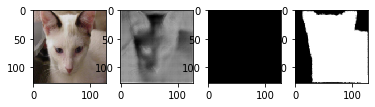

Training loss 1 : 0.6865175267060598
test set loss: 0.6874127558299473
test set dice coefficient: 0.3799398626599993
Training loss 2 : 0.6854327817757925
test set loss: 0.6867454165504092
test set dice coefficient: 0.3820727893284389
Training loss 3 : 0.6845262746016184
test set loss: 0.6857797900835673
test set dice coefficient: 0.3857156520798093
Training loss 4 : 0.6836496591567993
test set loss: 0.685040070897057
test set dice coefficient: 0.3899051348368327
Training loss 5 : 0.683082660039266
test set loss: 0.6847159947667804
test set dice coefficient: 0.39465425979523433


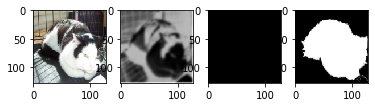

Training loss 6 : 0.6824013988176981
test set loss: 0.6847544312477112
test set dice coefficient: 0.39375970760981244
Training loss 7 : 0.6819474597771963
test set loss: 0.6847212711970011
test set dice coefficient: 0.39819173018137616
Training loss 8 : 0.6805310448010763
test set loss: 0.6833971852347964
test set dice coefficient: 0.39830598944709417
Training loss 9 : 0.6781724790732065
test set loss: 0.6796065029643831
test set dice coefficient: 0.3967015487807138
Training loss 10 : 0.674488345781962
test set loss: 0.6762694432621911
test set dice coefficient: 0.39329351697649273


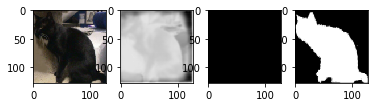

Training loss 11 : 0.6628508071104685
test set loss: 0.6536628831000555
test set dice coefficient: 0.3900066784449986
Training loss 12 : 0.6261406143506368
test set loss: 0.6358134434336707
test set dice coefficient: 0.3561624912988572
Training loss 13 : 0.6205901503562927
test set loss: 0.6092750827471415
test set dice coefficient: 0.34818344172977267
Training loss 14 : 0.5946396589279175
test set loss: 0.6399846389180138
test set dice coefficient: 0.3554092759177798
Training loss 15 : 0.5827229619026184
test set loss: 0.5779698420138586
test set dice coefficient: 0.3026033441225688


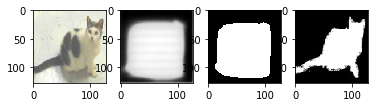

Training loss 16 : 0.58387823899587
test set loss: 0.5743846864927382
test set dice coefficient: 0.3043621466273353
Training loss 17 : 0.5692202349503835
test set loss: 0.5796242625940413
test set dice coefficient: 0.28325094495500835
Training loss 18 : 0.5499180754025778
test set loss: 0.6092164275192079
test set dice coefficient: 0.2975303956440517
Training loss 19 : 0.5650384376446406
test set loss: 0.5845720100970495
test set dice coefficient: 0.31448266052064444
Training loss 20 : 0.5472917854785919
test set loss: 0.5656965516862416
test set dice coefficient: 0.2588251261484055


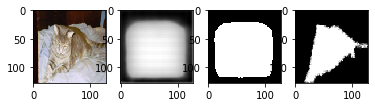

Training loss 21 : 0.5579353421926498
test set loss: 0.6012967470146361
test set dice coefficient: 0.3407916341509138
Training loss 22 : 0.5526869148015976
test set loss: 0.5464178565002623
test set dice coefficient: 0.2551785083044143
Training loss 23 : 0.5212899247805277
test set loss: 0.5530242792197636
test set dice coefficient: 0.28197758254550753
Training loss 24 : 0.5286972125371298
test set loss: 0.5292842515877315
test set dice coefficient: 0.2561095527240208
Training loss 25 : 0.524531826376915
test set loss: 0.541900729849225
test set dice coefficient: 0.22938737415132068


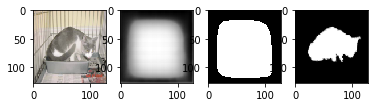

Training loss 26 : 0.5358799894650778
test set loss: 0.5434291589827764
test set dice coefficient: 0.2758399219740005
Training loss 27 : 0.5020335714022318
test set loss: 0.5366162771270389
test set dice coefficient: 0.23173056613831294
Training loss 28 : 0.5303048739830653
test set loss: 0.531019926071167
test set dice coefficient: 0.2558920355070205
Training loss 29 : 0.5128333022197088
test set loss: 0.5303856233755747
test set dice coefficient: 0.2575601169041225
Training loss 30 : 0.5109869092702866
test set loss: 0.5239643426168532
test set dice coefficient: 0.2479118648029509


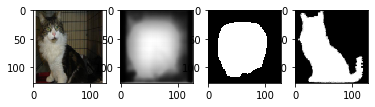

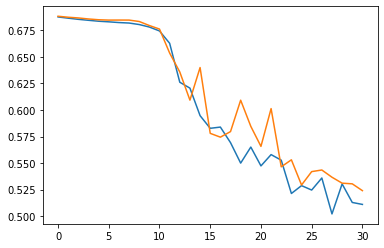

In [0]:
torch.manual_seed(28)
torch.cuda.manual_seed(21)
random.seed(1232)
model = UNet(3, 64)
BCEModel = trainModel(model, trainloader, testloader, 0.0001, 31, nn.BCELoss())

torch.save(BCEModel.state_dict(), "/content/drive/My Drive/Colab Notebooks/BCEModel.pth")

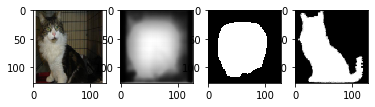

Dice Coefficient: 0.6860710978507996


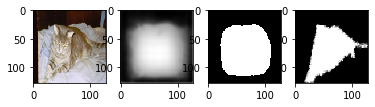

Dice Coefficient: 0.8142590522766113


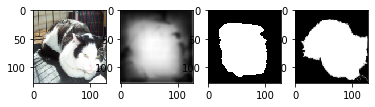

Dice Coefficient: 0.8062258362770081


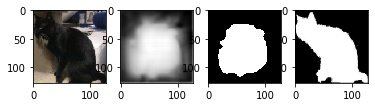

Dice Coefficient: 0.7221649289131165


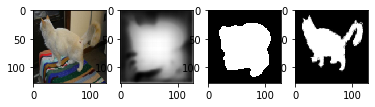

Dice Coefficient: 0.7507436275482178


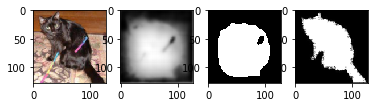

Dice Coefficient: 0.7606310248374939


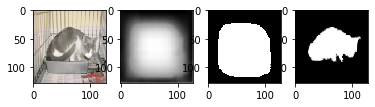

Dice Coefficient: 0.7035259008407593


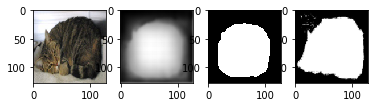

Dice Coefficient: 0.8452693223953247


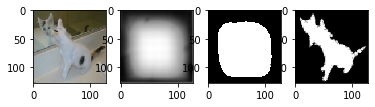

Dice Coefficient: 0.6821436285972595


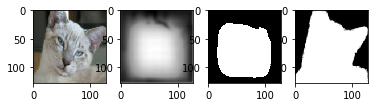

Dice Coefficient: 0.8175574541091919


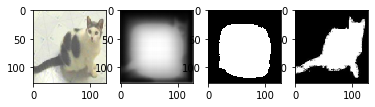

Dice Coefficient: 0.7469231486320496


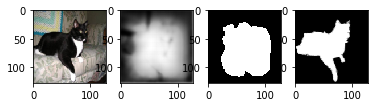

Dice Coefficient: 0.661227822303772


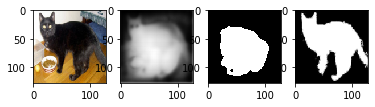

Dice Coefficient: 0.7413188815116882


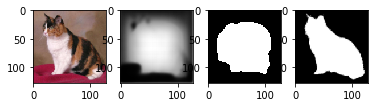

Dice Coefficient: 0.8004761934280396


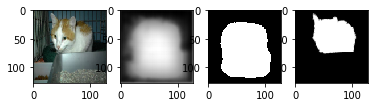

Dice Coefficient: 0.6545817852020264


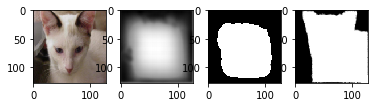

Dice Coefficient: 0.8032003045082092


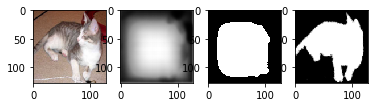

Dice Coefficient: 0.7844602465629578


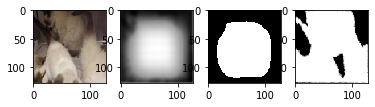

Dice Coefficient: 0.7607574462890625


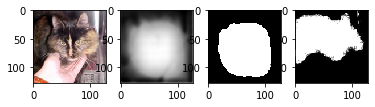

Dice Coefficient: 0.6896879076957703


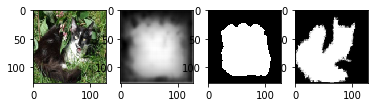

Dice Coefficient: 0.751228392124176


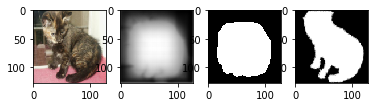

Dice Coefficient: 0.8113968372344971


In [0]:
testResults(BCEModel, testloader, DiceLoss)

Training loss 0 : 0.36915215849876404
test set results
test set loss: 0.3739126211120969
test set dice coefficient: 0.3739126211120969


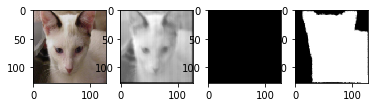

Training loss 1 : 0.3690942923227946
test set results
test set loss: 0.37124431417101905
test set dice coefficient: 0.37124431417101905
Training loss 2 : 0.3644011914730072
test set results
test set loss: 0.3662726566905067
test set dice coefficient: 0.3662726566905067
Training loss 3 : 0.35047627488772076
test set results
test set loss: 0.33225782144637334
test set dice coefficient: 0.33225782144637334
Training loss 4 : 0.3258906503518422
test set results
test set loss: 0.32669553870246526
test set dice coefficient: 0.32669553870246526
Training loss 5 : 0.31270942091941833
test set results
test set loss: 0.30990483931132723
test set dice coefficient: 0.30990483931132723


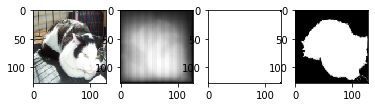

Training loss 6 : 0.292590469121933
test set results
test set loss: 0.29217337710516794
test set dice coefficient: 0.29217337710516794
Training loss 7 : 0.28030963738759357
test set results
test set loss: 0.26665771291369483
test set dice coefficient: 0.26665771291369483
Training loss 8 : 0.25841475526491803
test set results
test set loss: 0.2548465331395467
test set dice coefficient: 0.2548465331395467
Training loss 9 : 0.2566191554069519
test set results
test set loss: 0.2439157934415908
test set dice coefficient: 0.2439157934415908
Training loss 10 : 0.257946898539861
test set results
test set loss: 0.24747776701336816
test set dice coefficient: 0.24747776701336816


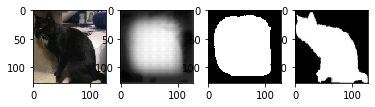

Training loss 11 : 0.24703064560890198
test set results
test set loss: 0.23375619025457472
test set dice coefficient: 0.23375619025457472
Training loss 12 : 0.2416220804055532
test set results
test set loss: 0.24385517835617065
test set dice coefficient: 0.24385517835617065
Training loss 13 : 0.2451083759466807
test set results
test set loss: 0.2235483555566697
test set dice coefficient: 0.2235483555566697
Training loss 14 : 0.247121532758077
test set results
test set loss: 0.228471006665911
test set dice coefficient: 0.228471006665911
Training loss 15 : 0.2349712053934733
test set results
test set loss: 0.2362173313186282
test set dice coefficient: 0.2362173313186282


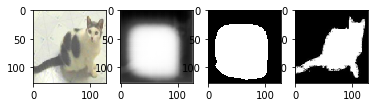

Training loss 16 : 0.23887730638186136
test set results
test set loss: 0.22567573047819592
test set dice coefficient: 0.22567573047819592
Training loss 17 : 0.23298648993174234
test set results
test set loss: 0.22932027067456925
test set dice coefficient: 0.22932027067456925
Training loss 18 : 0.2362349033355713
test set results
test set loss: 0.22494699557622275
test set dice coefficient: 0.22494699557622275
Training loss 19 : 0.23301402727762857
test set results
test set loss: 0.22578424782980056
test set dice coefficient: 0.22578424782980056
Training loss 20 : 0.22814002633094788
test set results
test set loss: 0.23055595727193923
test set dice coefficient: 0.23055595727193923


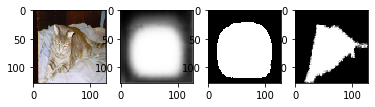

Training loss 21 : 0.23316113154093424
test set results
test set loss: 0.23461762496403285
test set dice coefficient: 0.23461762496403285
Training loss 22 : 0.2322258253892263
test set results
test set loss: 0.2195583468391782
test set dice coefficient: 0.2195583468391782
Training loss 23 : 0.22356560826301575
test set results
test set loss: 0.22198430413291567
test set dice coefficient: 0.22198430413291567
Training loss 24 : 0.22146764397621155
test set results
test set loss: 0.2238500061489287
test set dice coefficient: 0.2238500061489287
Training loss 25 : 0.22296290596326193
test set results
test set loss: 0.23621941464287893
test set dice coefficient: 0.23621941464287893


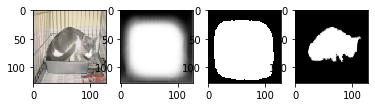

Training loss 26 : 0.22726603349049887
test set results
test set loss: 0.24206613926660447
test set dice coefficient: 0.24206613926660447
Training loss 27 : 0.2310693065325419
test set results
test set loss: 0.23592697722571238
test set dice coefficient: 0.23592697722571238
Training loss 28 : 0.21838471293449402
test set results
test set loss: 0.2313036322593689
test set dice coefficient: 0.2313036322593689
Training loss 29 : 0.21532716353734335
test set results
test set loss: 0.2557905259586516
test set dice coefficient: 0.2557905259586516
Training loss 30 : 0.21139166752497354
test set results
test set loss: 0.29386631080082487
test set dice coefficient: 0.29386631080082487


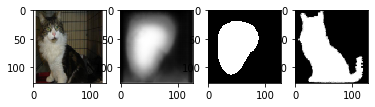

Training loss 31 : 0.22283845146497092
test set results
test set loss: 0.23551481394540696
test set dice coefficient: 0.23551481394540696
Training loss 32 : 0.216113011042277
test set results
test set loss: 0.23323199011030651
test set dice coefficient: 0.23323199011030651
Training loss 33 : 0.21914521853129068
test set results
test set loss: 0.22137895084562756
test set dice coefficient: 0.22137895084562756
Training loss 34 : 0.21655088663101196
test set results
test set loss: 0.22637208018984115
test set dice coefficient: 0.22637208018984115
Training loss 35 : 0.22026867667833963
test set results
test set loss: 0.2335338308697655
test set dice coefficient: 0.2335338308697655


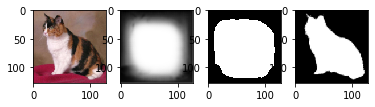

Training loss 36 : 0.2223446468512217
test set results
test set loss: 0.2545179440861657
test set dice coefficient: 0.2545179440861657
Training loss 37 : 0.21998579303423563
test set results
test set loss: 0.237386683622996
test set dice coefficient: 0.237386683622996
Training loss 38 : 0.218499094247818
test set results
test set loss: 0.23344757159550986
test set dice coefficient: 0.23344757159550986
Training loss 39 : 0.2098716696103414
test set results
test set loss: 0.22967419454029628
test set dice coefficient: 0.22967419454029628
Training loss 40 : 0.20953081051508585
test set results
test set loss: 0.23234062251590548
test set dice coefficient: 0.23234062251590548


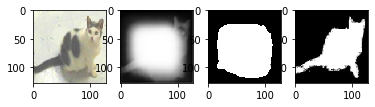

Training loss 41 : 0.2056652009487152
test set results
test set loss: 0.23806558904193698
test set dice coefficient: 0.23806558904193698
Training loss 42 : 0.20851419369379678
test set results
test set loss: 0.23309160130364553
test set dice coefficient: 0.23309160130364553
Training loss 43 : 0.21039966742197672
test set results
test set loss: 0.2469682324500311
test set dice coefficient: 0.2469682324500311
Training loss 44 : 0.2056335707505544
test set results
test set loss: 0.2331619149162656
test set dice coefficient: 0.2331619149162656
Training loss 45 : 0.20382904012997946
test set results
test set loss: 0.24475470327195667
test set dice coefficient: 0.24475470327195667


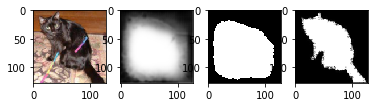

Training loss 46 : 0.21208838621775308
test set results
test set loss: 0.27783918664568946
test set dice coefficient: 0.27783918664568946
Training loss 47 : 0.20776814222335815
test set results
test set loss: 0.23092663855779738
test set dice coefficient: 0.23092663855779738
Training loss 48 : 0.20391470193862915
test set results
test set loss: 0.23441769111724126
test set dice coefficient: 0.23441769111724126
Training loss 49 : 0.2024961312611898
test set results
test set loss: 0.2529099952606928
test set dice coefficient: 0.2529099952606928
Training loss 50 : 0.2011348307132721
test set results
test set loss: 0.2546256042662121
test set dice coefficient: 0.2546256042662121


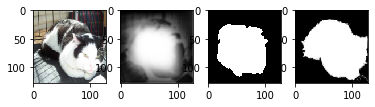

Training loss 51 : 0.20209655165672302
test set results
test set loss: 0.2348751085145133
test set dice coefficient: 0.2348751085145133
Training loss 52 : 0.2084094981352488
test set results
test set loss: 0.2387965747288295
test set dice coefficient: 0.2387965747288295
Training loss 53 : 0.2036012808481852
test set results
test set loss: 0.2514445497876122
test set dice coefficient: 0.2514445497876122
Training loss 54 : 0.1991338829199473
test set results
test set loss: 0.23859806855519614
test set dice coefficient: 0.23859806855519614
Training loss 55 : 0.19728445013364157
test set results
test set loss: 0.232997423126584
test set dice coefficient: 0.232997423126584


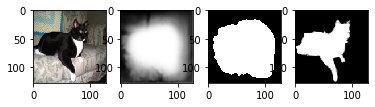

Training loss 56 : 0.2001824975013733
test set results
test set loss: 0.2757113916533334
test set dice coefficient: 0.2757113916533334
Training loss 57 : 0.20181795954704285
test set results
test set loss: 0.23754751682281494
test set dice coefficient: 0.23754751682281494
Training loss 58 : 0.18857545653978983
test set results
test set loss: 0.2500209127153669
test set dice coefficient: 0.2500209127153669
Training loss 59 : 0.18519190947214761
test set results
test set loss: 0.27457677466528757
test set dice coefficient: 0.27457677466528757
Training loss 60 : 0.18544992804527283
test set results
test set loss: 0.22765523195266724
test set dice coefficient: 0.22765523195266724


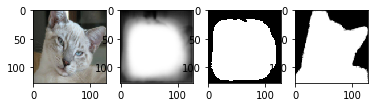

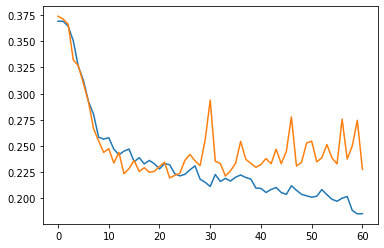

In [0]:
torch.manual_seed(28)
torch.cuda.manual_seed(21)
random.seed(1232)
model = UNet(3, 64)
diceModel = trainModel(model, trainloader, testloader, 0.0001, 61, DiceLoss)

torch.save(diceModel.state_dict(), "/content/drive/My Drive/Colab Notebooks/DiceModel.pth")

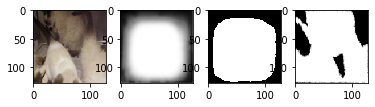

Dice Coefficient: 0.8688271641731262


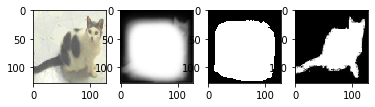

Dice Coefficient: 0.6950706839561462


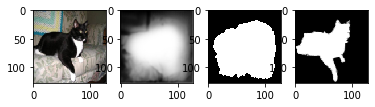

Dice Coefficient: 0.6951608657836914


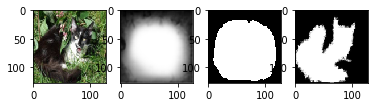

Dice Coefficient: 0.8087819218635559


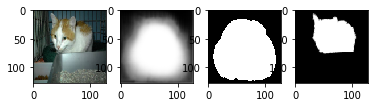

Dice Coefficient: 0.5939881205558777


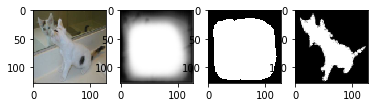

Dice Coefficient: 0.5943397283554077


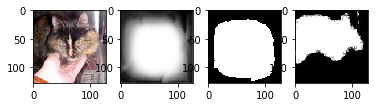

Dice Coefficient: 0.7270067930221558


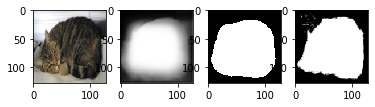

Dice Coefficient: 0.9378823041915894


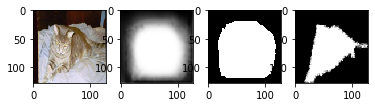

Dice Coefficient: 0.7722111940383911


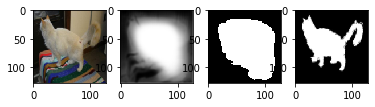

Dice Coefficient: 0.7030780911445618


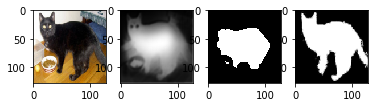

Dice Coefficient: 0.8022279143333435


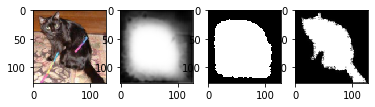

Dice Coefficient: 0.7979170083999634


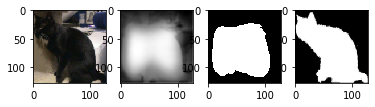

Dice Coefficient: 0.8030627965927124


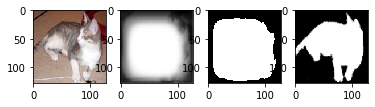

Dice Coefficient: 0.7954604029655457


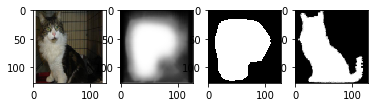

Dice Coefficient: 0.7276958227157593


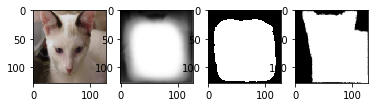

Dice Coefficient: 0.8891827464103699


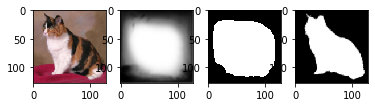

Dice Coefficient: 0.8207210898399353


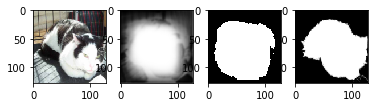

Dice Coefficient: 0.8754292130470276


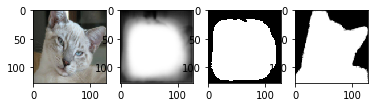

Dice Coefficient: 0.8826438188552856


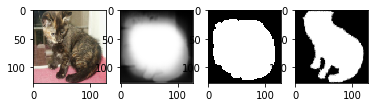

Dice Coefficient: 0.8452592492103577


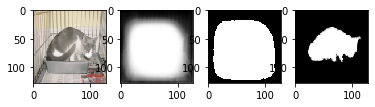

Dice Coefficient: 0.5832931995391846


In [0]:
testResults(diceModel, testloader, DiceLoss)

In [0]:
class CustomDataAugmentation(Dataset):
    def __init__(self, root_dir, offset, transform, numData, AugTransformList):
        self.root_dir = root_dir
        self.offset = offset
        self.transform = transform
        self.numData = numData
        self.AugTransformList = AugTransformList
        self.storage = {}
        self.baseLenData = len(os.listdir(self.root_dir + "input/"))

    def __len__(self):
        return self.numData

    def __getitem__(self, idx):
        baseIndex = idx % self.baseLenData

        if baseIndex not in self.storage:
          img_name = self.root_dir + "input/cat." + str(self.offset + baseIndex) + ".jpg"
          image = io.imread(img_name)
          
          mask_name = self.root_dir + "mask/mask_cat." + str(self.offset + baseIndex) + ".jpg"
          mask = io.imread(mask_name)

          self.storage[baseIndex] = toPIL({'image': image, 'mask': mask})
        
        if idx not in self.storage:
          originalSample = self.storage[baseIndex]
          
          randTransform = transforms.RandomChoice(self.AugTransformList)
          self.storage[idx] = randTransform(originalSample)


        sample = self.storage[idx]

        if self.transform:
            sample = self.transform(sample)

        return sample

def Transform_aug(sample):
  image = sample['image']
  mask = sample['mask']

  #to_PIL = transforms.ToPILImage()
  #image = to_PIL(image)
  #mask = to_PIL(mask)

  resize = transforms.Resize((128, 128))
  image = resize(image)
  mask = resize(mask)

  to_tensor = transforms.ToTensor()
  image = to_tensor(image)
  mask = to_tensor(mask)

  return {'image': image, 'mask' : mask}


def toPIL(sample):
  image, mask = breakSample(sample)
  to_PIL = transforms.ToPILImage()
  image = to_PIL(image)
  mask = to_PIL(mask)

  return {'image': image, 'mask' : mask} 


def crop(image, i1, i2, j1, j2):
  image = np.asarray(image)
  image = image.copy()[min(j1, j2): max(j1, j2), min(i1, i2):max(i1, i2)]
  return transforms.ToPILImage()(image)


def breakSample(sample):
  return sample['image'], sample['mask']

def randomFlip(sample):
  image, mask = breakSample(sample)

  seed = np.random.randint(2147483647) # make a seed with numpy generator 
  flip = transforms.RandomChoice([transforms.RandomVerticalFlip(), transforms.RandomHorizontalFlip()])

  random.seed(seed)
  image = flip(image)
  random.seed(seed)
  mask = flip(mask)

  return {'image': image, 'mask' : mask}

def randomRotations(sample):
  image, mask = breakSample(sample)

  seed = np.random.randint(2147483647) # make a seed with numpy generator 
  rotation = transforms.RandomRotation((0, 359))

  random.seed(seed)
  image = rotation(image)
  random.seed(seed)
  mask = rotation(mask)

  return {'image': image, 'mask' : mask}

def randomCrop(sample):
  image, mask = breakSample(sample)

  i1 = random.randint(0, image.size[0] - 1)
  i2 = random.randint(0, image.size[0] - 1)
  while abs(i2 - i1) < 10:
    i2 = random.randint(0, image.size[0] - 1)

  j1 = random.randint(0, image.size[1] - 1)
  j2 = random.randint(0, image.size[1] - 1)
  while abs(j2 - j1) < 10:
    j2 = random.randint(0, image.size[1] - 1)

  image = crop(image, i1, i2, j1, j2)
  mask = crop(mask, i1, i2, j1, j2)

  resize = transforms.Resize((128, 128))
  image = resize(image)
  mask = resize(mask)

  return {'image': image, 'mask' : mask}

def randomAffine(sample):
  image, mask = breakSample(sample)

  seed = np.random.randint(2147483647) # make a seed with numpy generator 
  affine = transforms.RandomAffine((0, 359))

  random.seed(seed)
  image = affine(image)
  random.seed(seed)
  mask = affine(mask)

  return {'image': image, 'mask' : mask}

In [0]:
transform = transforms.Compose([Transform_aug])

torch.manual_seed(28)
torch.cuda.manual_seed(21)
random.seed(1232)
aug_trainset = CustomDataAugmentation("/content/drive/My Drive/Colab Notebooks/cat_data/Train/", 0, transform, 360, [randomFlip, randomRotations, randomAffine, randomCrop])
aug_trainloader = torch.utils.data.DataLoader(aug_trainset, batch_size=10, shuffle=True)

torch.manual_seed(28)
torch.cuda.manual_seed(21)
random.seed(1232)
aug_testset = CustomDataAugmentation("/content/drive/My Drive/Colab Notebooks/cat_data/Test/", 60, transform, 126, [randomFlip, randomRotations, randomAffine, randomCrop])
aug_testloader = torch.utils.data.DataLoader(aug_testset, batch_size=1, shuffle=True)

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Training loss 0 : 0.31708014011383057
test set results
test set loss: 0.34801882694637964
test set dice coefficient: 0.34801882694637964


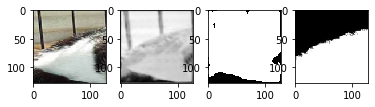

Training loss 1 : 0.2982779045899709
test set results
test set loss: 0.3393777414919838
test set dice coefficient: 0.3393777414919838
Training loss 2 : 0.2857925213045544
test set results
test set loss: 0.3478478514958942
test set dice coefficient: 0.3478478514958942
Training loss 3 : 0.28197912043995327
test set results
test set loss: 0.35952802357219515
test set dice coefficient: 0.35952802357219515
Training loss 4 : 0.2640972634156545
test set results
test set loss: 0.27158657189399477
test set dice coefficient: 0.27158657189399477
Training loss 5 : 0.2477800746758779
test set results
test set loss: 0.2574698158672878
test set dice coefficient: 0.2574698158672878


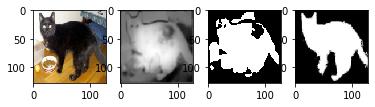

Training loss 6 : 0.24341211550765568
test set results
test set loss: 0.26663879458866424
test set dice coefficient: 0.26663879458866424
Training loss 7 : 0.230451762676239
test set results
test set loss: 0.2486945546808697
test set dice coefficient: 0.2486945546808697
Training loss 8 : 0.22366920610268912
test set results
test set loss: 0.2584124084502932
test set dice coefficient: 0.2584124084502932
Training loss 9 : 0.2324551757838991
test set results
test set loss: 0.2688670891617972
test set dice coefficient: 0.2688670891617972
Training loss 10 : 0.22536955773830414
test set results
test set loss: 0.25934343442084296
test set dice coefficient: 0.25934343442084296


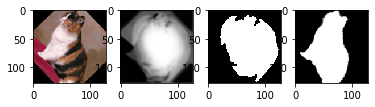

Training loss 11 : 0.23039433028962877
test set results
test set loss: 0.25700031008039204
test set dice coefficient: 0.25700031008039204
Training loss 12 : 0.2268558061785168
test set results
test set loss: 0.2596596848397028
test set dice coefficient: 0.2596596848397028
Training loss 13 : 0.22284785078631508
test set results
test set loss: 0.32946948021177264
test set dice coefficient: 0.32946948021177264
Training loss 14 : 0.22091630597909293
test set results
test set loss: 0.2575273352956015
test set dice coefficient: 0.2575273352956015
Training loss 15 : 0.2105703287654453
test set results
test set loss: 0.2626117325964428
test set dice coefficient: 0.2626117325964428


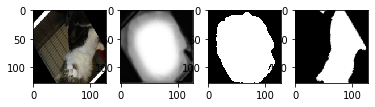

Training loss 16 : 0.2096016804377238
test set results
test set loss: 0.27319138816424776
test set dice coefficient: 0.27319138816424776
Training loss 17 : 0.22125081552399528
test set results
test set loss: 0.29491152176781305
test set dice coefficient: 0.29491152176781305
Training loss 18 : 0.2199191947778066
test set results
test set loss: 0.2662517920372978
test set dice coefficient: 0.2662517920372978
Training loss 19 : 0.21757053169939253
test set results
test set loss: 0.2535537528613257
test set dice coefficient: 0.2535537528613257
Training loss 20 : 0.2082224057780372
test set results
test set loss: 0.2523941407127986
test set dice coefficient: 0.2523941407127986


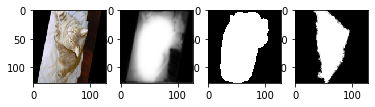

Training loss 21 : 0.20339005688826242
test set results
test set loss: 0.29655555079853724
test set dice coefficient: 0.29655555079853724
Training loss 22 : 0.20863082508246103
test set results
test set loss: 0.2683391509548066
test set dice coefficient: 0.2683391509548066
Training loss 23 : 0.20914717846446568
test set results
test set loss: 0.2465773101836916
test set dice coefficient: 0.2465773101836916
Training loss 24 : 0.20610257983207703
test set results
test set loss: 0.2541571259498596
test set dice coefficient: 0.2541571259498596
Training loss 25 : 0.20446390410264334
test set results
test set loss: 0.2646363831701733
test set dice coefficient: 0.2646363831701733


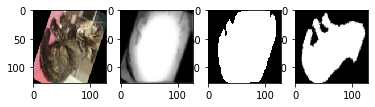

Training loss 26 : 0.19830821288956535
test set results
test set loss: 0.26548519967094303
test set dice coefficient: 0.26548519967094303
Training loss 27 : 0.20180092089705998
test set results
test set loss: 0.25281769936046905
test set dice coefficient: 0.25281769936046905
Training loss 28 : 0.20292293859852684
test set results
test set loss: 0.27510322133700055
test set dice coefficient: 0.27510322133700055
Training loss 29 : 0.19438586466842228
test set results
test set loss: 0.24698564362904382
test set dice coefficient: 0.24698564362904382
Training loss 30 : 0.20774978895982107
test set results
test set loss: 0.26552079310492865
test set dice coefficient: 0.26552079310492865


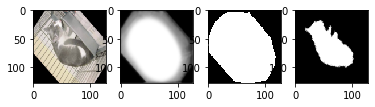

Training loss 31 : 0.18984732197390664
test set results
test set loss: 0.27197019448356025
test set dice coefficient: 0.27197019448356025
Training loss 32 : 0.18018499347898695
test set results
test set loss: 0.27224960639363244
test set dice coefficient: 0.27224960639363244
Training loss 33 : 0.18905415634314218
test set results
test set loss: 0.27796867915562223
test set dice coefficient: 0.27796867915562223
Training loss 34 : 0.188548990421825
test set results
test set loss: 0.2661287287871043
test set dice coefficient: 0.2661287287871043
Training loss 35 : 0.18018115725782183
test set results
test set loss: 0.30336609293544103
test set dice coefficient: 0.30336609293544103


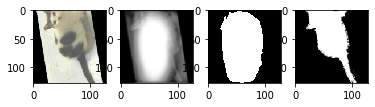

Training loss 36 : 0.17724953260686663
test set results
test set loss: 0.28193872173627216
test set dice coefficient: 0.28193872173627216
Training loss 37 : 0.1821393155389362
test set results
test set loss: 0.28208407759666443
test set dice coefficient: 0.28208407759666443
Training loss 38 : 0.1734706527656979
test set results
test set loss: 0.28152622826515683
test set dice coefficient: 0.28152622826515683
Training loss 39 : 0.19724129140377045
test set results
test set loss: 0.28620888127221
test set dice coefficient: 0.28620888127221
Training loss 40 : 0.1849886311425103
test set results
test set loss: 0.2755868174727001
test set dice coefficient: 0.2755868174727001


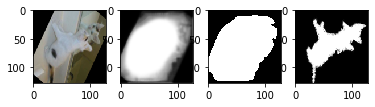

Training loss 41 : 0.17952698469161987
test set results
test set loss: 0.2654292843644581
test set dice coefficient: 0.2654292843644581
Training loss 42 : 0.17431476877795327
test set results
test set loss: 0.2676377982374222
test set dice coefficient: 0.2676377982374222
Training loss 43 : 0.17718995114167532
test set results
test set loss: 0.2686997287803226
test set dice coefficient: 0.2686997287803226
Training loss 44 : 0.16559261745876735
test set results
test set loss: 0.2550850964727856
test set dice coefficient: 0.2550850964727856
Training loss 45 : 0.17637178798516592
test set results
test set loss: 0.2645115095471579
test set dice coefficient: 0.2645115095471579


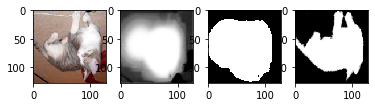

Training loss 46 : 0.16690246926413643
test set results
test set loss: 0.26897623898491024
test set dice coefficient: 0.26897623898491024
Training loss 47 : 0.16460074484348297
test set results
test set loss: 0.3008132014009688
test set dice coefficient: 0.3008132014009688
Training loss 48 : 0.15701719290680355
test set results
test set loss: 0.2776019885426476
test set dice coefficient: 0.2776019885426476
Training loss 49 : 0.17399478952089945
test set results
test set loss: 0.28121225181080045
test set dice coefficient: 0.28121225181080045
Training loss 50 : 0.1787925511598587
test set results
test set loss: 0.29025520313353764
test set dice coefficient: 0.29025520313353764


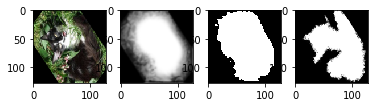

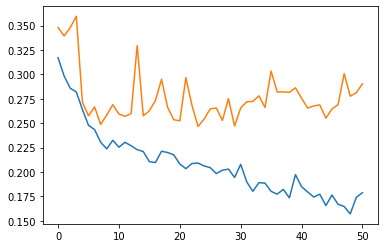

In [0]:
torch.manual_seed(28)
torch.cuda.manual_seed(21)
random.seed(1232)

aug_net = UNet(3, 64)
aug_net = trainModel(aug_net, aug_trainloader, aug_testloader, 0.001, 51, DiceLoss)
torch.save(aug_net.state_dict(), "/content/drive/My Drive/Colab Notebooks/AugmentModel.pth")

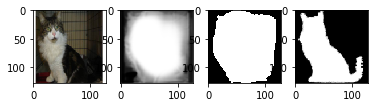

Dice Coefficient: 0.7247459888458252


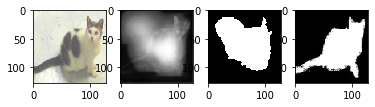

Dice Coefficient: 0.7393407225608826


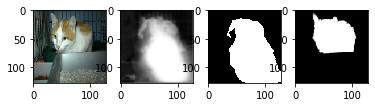

Dice Coefficient: 0.5839016437530518


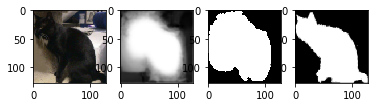

Dice Coefficient: 0.839425802230835


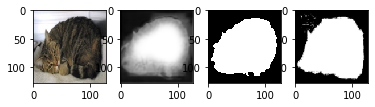

Dice Coefficient: 0.924294650554657


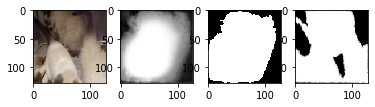

Dice Coefficient: 0.8669089078903198


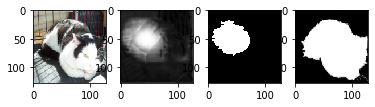

Dice Coefficient: 0.5548767447471619


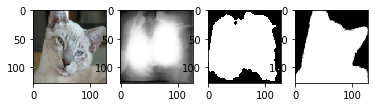

Dice Coefficient: 0.8483651876449585


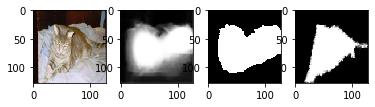

Dice Coefficient: 0.7752403020858765


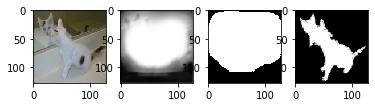

Dice Coefficient: 0.558806836605072


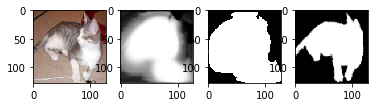

Dice Coefficient: 0.7808222770690918


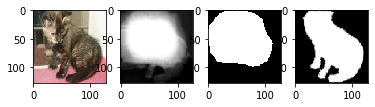

Dice Coefficient: 0.7841829657554626


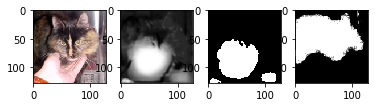

Dice Coefficient: 0.40192675590515137


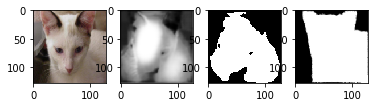

Dice Coefficient: 0.8196485042572021


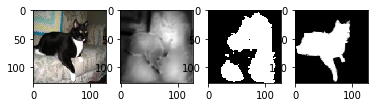

Dice Coefficient: 0.5434538722038269


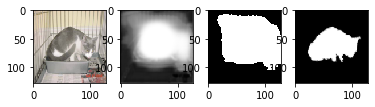

Dice Coefficient: 0.683017373085022


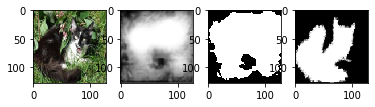

Dice Coefficient: 0.6690355539321899


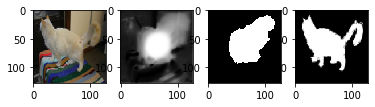

Dice Coefficient: 0.7454860806465149


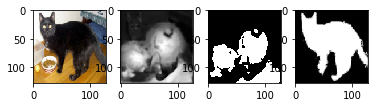

Dice Coefficient: 0.5378298163414001


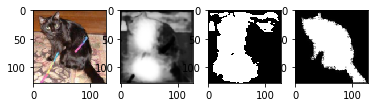

Dice Coefficient: 0.5713253617286682


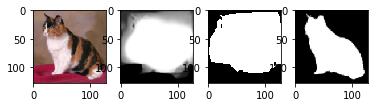

Dice Coefficient: 0.7164604067802429


In [0]:
testResults(aug_net, testloader, DiceLoss)

In [0]:
class CustomDataPet(Dataset):
  def __init__(self, root_dir, imagePrefix, maskPrefix, fileset, numdata, transform):
    self.root_dir = root_dir
    self.imagePrefix = imagePrefix
    self.maskPrefix = maskPrefix
    
    if len(fileset) == 0:
      self.fileset = set()
      imagelist = os.listdir(self.root_dir + imagePrefix)
      masklist = os.listdir(self.root_dir + maskPrefix)

      imageset = set()
      for imagename in imagelist:
        imageset.add(imagename[:-3])

      maskset = set()
      for maskname in masklist:
        maskset.add(maskname[:-3])

      #print(len(imagelist), len(masklist))

      for key in maskset:
        #print(i, imagelist[i], masklist[i])

        if key in imageset:
          #print(key)
          self.fileset.add((key + "jpg", key + "png"))
        

    else:
      self.fileset = fileset

    self.numData = numdata
    self.storage = {}
    self.transform = transform
    #print(self.storage)

  def getRemainingFiles(self):
    return self.fileset

  def __len__(self):
    return self.numData

  def __getitem__(self, idx):
      if idx not in self.storage:
        try:
          imagepath, maskpath = random.choice([x for x in self.fileset])

          image = io.imread(self.root_dir + self.imagePrefix + imagepath)

          if len(image.shape) == 2: 
            image = cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)

          image = image

          
          mask = io.imread(self.root_dir + self.maskPrefix + maskpath)

          mask[mask == 1] = 1
          mask[mask == 2] = 0
          mask[mask == 3] = 0

          self.fileset.remove((imagepath, maskpath))

          self.storage[idx] = {'image' : image, 'mask' : mask * 255}
        except e:
          print(e, imagepath, maskpath)
          raise e

      sample = self.storage[idx]

      if self.transform:
        sample = self.transform(sample)



      return sample

def Transform(sample):
  image = sample['image']
  mask = sample['mask']

  to_PIL = transforms.ToPILImage()
  image = to_PIL(image)
  mask = to_PIL(mask)

  resize = transforms.Resize((128, 128))
  image = resize(image)
  mask = resize(mask)

  to_tensor = transforms.ToTensor()
  image = to_tensor(image)
  mask = to_tensor(mask)

  return {'image': image, 'mask' : mask}



In [0]:
transform = transforms.Compose([Transform])


torch.manual_seed(28)
torch.cuda.manual_seed(21)
random.seed(1232)
trainset_pet = CustomDataPet("/content/drive/My Drive/Colab Notebooks/Oxford_Pet_data/", "images/", "masks/", set(), 350, transform)
trainloader_pet = torch.utils.data.DataLoader(trainset_pet, batch_size=10, shuffle=True)


torch.manual_seed(3892)
torch.cuda.manual_seed(352)
random.seed(234)
testset_pet = CustomDataPet("/content/drive/My Drive/Colab Notebooks/Oxford_Pet_data/", "images/", "masks/", trainset_pet.getRemainingFiles(), 150, transform)
testloader_pet = torch.utils.data.DataLoader(testset_pet, batch_size=10, shuffle=True)



In [0]:
transform = transforms.Compose([Transform])


torch.manual_seed(28)
torch.cuda.manual_seed(21)
random.seed(1232)
trainset_dogs = CustomDataPet("/content/pet_data/", "images/", "masks/", set(), 350, transform)
trainloader_dogs = torch.utils.data.DataLoader(trainset_dogs, batch_size=10, shuffle=True)


torch.manual_seed(3892)
torch.cuda.manual_seed(352)
random.seed(234)
testset_dogs = CustomDataPet("/content/pet_data/", "images/", "masks/", trainset_dogs.getRemainingFiles(), 150, transform)
testloader_dogs = torch.utils.data.DataLoader(testset_dogs, batch_size=10, shuffle=True)

In [0]:
for i in range(len(trainset_pet)):
  x = trainset_pet[i]
  try:
    assert x['image'].size() == (3, 128, 128)
    assert x['mask'].size() == (1, 128, 128)
  except:
    #print(x.size)
    print(x['image'].size(), x['mask'].size())
    raise
for i in range(len(testset_pet)):
  x = trainset_pet[i]
  try:
    assert x['image'].size() == (3, 128, 128)
    assert x['mask'].size() == (1, 128, 128)
  except:
    #print(x.size)
    print(x['image'].size(), x['mask'].size())
    raise

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Training loss 0 : 0.6700961300304957
test set results
test set loss: 0.6322017788887024
test set dice coefficient: 0.5098311185836792


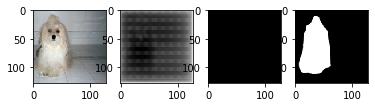

Training loss 1 : 0.6146237679890224
test set results
test set loss: 0.6096344312032064
test set dice coefficient: 0.5385409315427144
Training loss 2 : 0.5781148595469339
test set results
test set loss: 0.534950457016627
test set dice coefficient: 0.49350959062576294
Training loss 3 : 0.5150302239826747
test set results
test set loss: 0.5017780423164367
test set dice coefficient: 0.4270001212755839
Training loss 4 : 0.4962462331567492
test set results
test set loss: 0.4890631357828776
test set dice coefficient: 0.3876893679300944
Training loss 5 : 0.4841954801763807
test set results
test set loss: 0.4803705672423045
test set dice coefficient: 0.35185149908065794


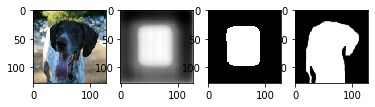

Training loss 6 : 0.47447139024734497
test set results
test set loss: 0.4826949894428253
test set dice coefficient: 0.4088225324948629
Training loss 7 : 0.4684163068022047
test set results
test set loss: 0.4640836993853251
test set dice coefficient: 0.3626504778862
Training loss 8 : 0.46557336705071584
test set results
test set loss: 0.46327479084332784
test set dice coefficient: 0.38300264279047647
Training loss 9 : 0.451270067691803
test set results
test set loss: 0.4619970480600993
test set dice coefficient: 0.3962156414985657
Training loss 10 : 0.4407154968806675
test set results
test set loss: 0.43473869760831196
test set dice coefficient: 0.30842636426289877


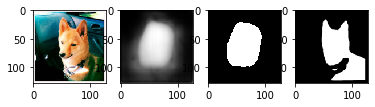

Training loss 11 : 0.44096264924321854
test set results
test set loss: 0.43335106372833254
test set dice coefficient: 0.3146827697753906
Training loss 12 : 0.43557557804243907
test set results
test set loss: 0.4258930722872416
test set dice coefficient: 0.31762138605117796
Training loss 13 : 0.42494104845183234
test set results
test set loss: 0.4283738215764364
test set dice coefficient: 0.3519370953241984
Training loss 14 : 0.4176118654864175
test set results
test set loss: 0.41017521619796754
test set dice coefficient: 0.3177688916524251
Training loss 15 : 0.4182575949600765
test set results
test set loss: 0.419757882754008
test set dice coefficient: 0.3134038011233012


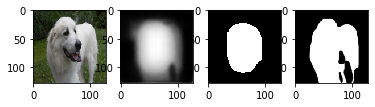

Training loss 16 : 0.4249292595045907
test set results
test set loss: 0.42272621393203735
test set dice coefficient: 0.304825758934021
Training loss 17 : 0.41722741382462636
test set results
test set loss: 0.4074671626091003
test set dice coefficient: 0.32124383449554444
Training loss 18 : 0.40273745570863995
test set results
test set loss: 0.4157866875330607
test set dice coefficient: 0.2639305114746094
Training loss 19 : 0.4009298060621534
test set results
test set loss: 0.4020415703455607
test set dice coefficient: 0.25449581146240235
Training loss 20 : 0.39953209246907917
test set results
test set loss: 0.43175966540972394
test set dice coefficient: 0.378149139881134


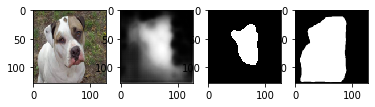

Training loss 21 : 0.3877547459942954
test set results
test set loss: 0.3759570022424062
test set dice coefficient: 0.2550806999206543
Training loss 22 : 0.3802491060325078
test set results
test set loss: 0.37346684535344443
test set dice coefficient: 0.24799298445383708
Training loss 23 : 0.37042401007243564
test set results
test set loss: 0.3924476385116577
test set dice coefficient: 0.29556389252344767
Training loss 24 : 0.3793228396347591
test set results
test set loss: 0.3673416535059611
test set dice coefficient: 0.26029992500940957
Training loss 25 : 0.3724114009312221
test set results
test set loss: 0.36196123162905375
test set dice coefficient: 0.22233974536259968


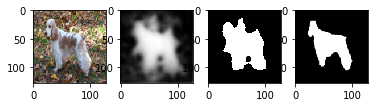

Training loss 26 : 0.36184448344366893
test set results
test set loss: 0.37477152546246845
test set dice coefficient: 0.28157437642415367
Training loss 27 : 0.36227989281926837
test set results
test set loss: 0.35844007730484007
test set dice coefficient: 0.24530222813288372
Training loss 28 : 0.34691759901387353
test set results
test set loss: 0.3657519618670146
test set dice coefficient: 0.22398672898610433
Training loss 29 : 0.35001004423413956
test set results
test set loss: 0.37463552355766294
test set dice coefficient: 0.2380441387494405
Training loss 30 : 0.35659880765846796
test set results
test set loss: 0.3627082983652751
test set dice coefficient: 0.25543373425801597


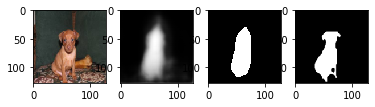

Training loss 31 : 0.33622782145227703
test set results
test set loss: 0.338226647178332
test set dice coefficient: 0.2298532207806905
Training loss 32 : 0.3257118135690689
test set results
test set loss: 0.34923643469810484
test set dice coefficient: 0.20224434932072957
Training loss 33 : 0.31983039549418857
test set results
test set loss: 0.3441784203052521
test set dice coefficient: 0.2049480716387431
Training loss 34 : 0.30880870648792813
test set results
test set loss: 0.3453444520632426
test set dice coefficient: 0.22588601112365722
Training loss 35 : 0.3137130992753165
test set results
test set loss: 0.3321265737215678
test set dice coefficient: 0.19170854886372884


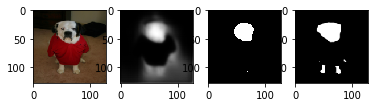

Training loss 36 : 0.30311160555907657
test set results
test set loss: 0.32793692549069725
test set dice coefficient: 0.20810075203577677
Training loss 37 : 0.2951571749789374
test set results
test set loss: 0.3211096157630285
test set dice coefficient: 0.19579635858535765
Training loss 38 : 0.2821082868746349
test set results
test set loss: 0.3236637979745865
test set dice coefficient: 0.20501203139623006
Training loss 39 : 0.2844342657497951
test set results
test set loss: 0.3401704649130503
test set dice coefficient: 0.23284920851389568
Training loss 40 : 0.28566377120358605
test set results
test set loss: 0.33432447016239164
test set dice coefficient: 0.2103360374768575


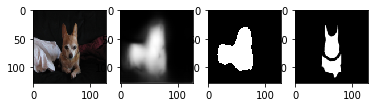

Training loss 41 : 0.2672730531011309
test set results
test set loss: 0.3309663563966751
test set dice coefficient: 0.19150344530741373
Training loss 42 : 0.2527146973780223
test set results
test set loss: 0.3295194764931997
test set dice coefficient: 0.18628069559733074
Training loss 43 : 0.2466374418565205
test set results
test set loss: 0.37020424405733743
test set dice coefficient: 0.1963979204495748
Training loss 44 : 0.24843809136322567
test set results
test set loss: 0.3408736377954483
test set dice coefficient: 0.19752416610717774
Training loss 45 : 0.24679891467094422
test set results
test set loss: 0.3589721361796061
test set dice coefficient: 0.20046287377675373


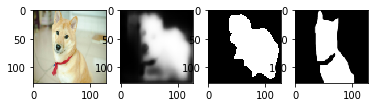

Training loss 46 : 0.2567627604518618
test set results
test set loss: 0.34126026928424835
test set dice coefficient: 0.19642825921376547
Training loss 47 : 0.24141366694654737
test set results
test set loss: 0.35206731259822843
test set dice coefficient: 0.1984128475189209
Training loss 48 : 0.22371758435453687
test set results
test set loss: 0.3252896974484126
test set dice coefficient: 0.19041037956873577
Training loss 49 : 0.2134343019553593
test set results
test set loss: 0.3688984115918477
test set dice coefficient: 0.19789366324742635
Training loss 50 : 0.20192257761955262
test set results
test set loss: 0.37001760403315226
test set dice coefficient: 0.20306659142176312


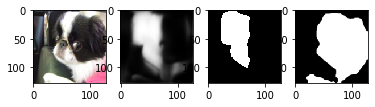

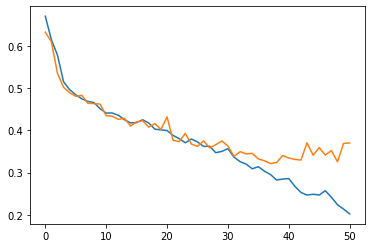

In [0]:
torch.manual_seed(218)
torch.cuda.manual_seed(241)
random.seed(34)
unet_transfer_dog = UNet(3, 32)
unet_transfer_dog = trainModel(unet_transfer_dog, trainloader_dogs, testloader_dogs, 0.0001, 51, Dice)
torch.save(unet_transfer_dog.state_dict(), "/content/drive/My Drive/Colab Notebooks/transfer_model_dog.pth")

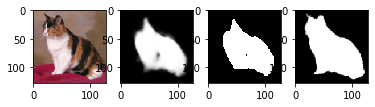

performance: 0.8906586170196533


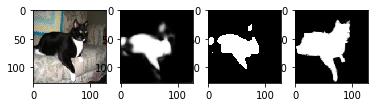

performance: 0.7696467638015747


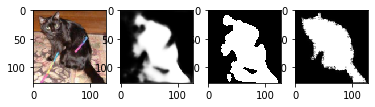

performance: 0.8329014778137207


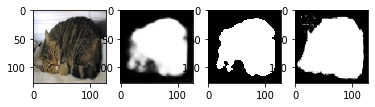

performance: 0.9276717901229858


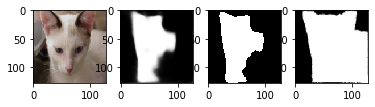

performance: 0.6854596138000488


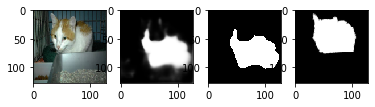

performance: 0.48202162981033325


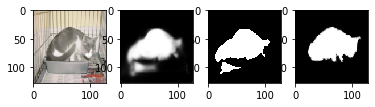

performance: 0.87677401304245


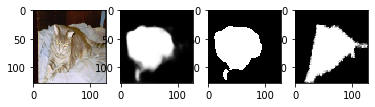

performance: 0.8140226006507874


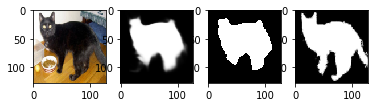

performance: 0.8900838494300842


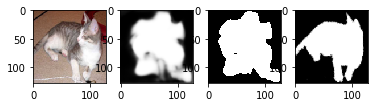

performance: 0.7929844856262207


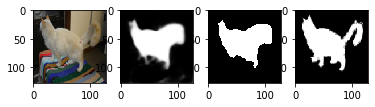

performance: 0.8491989374160767


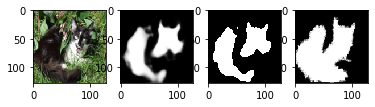

performance: 0.799665629863739


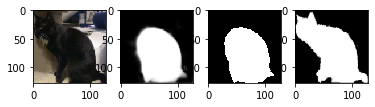

performance: 0.846979558467865


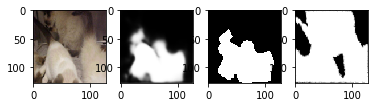

performance: 0.5902172327041626


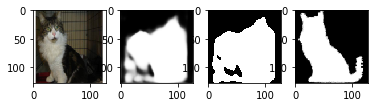

performance: 0.6634117364883423


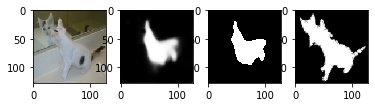

performance: 0.6817734241485596


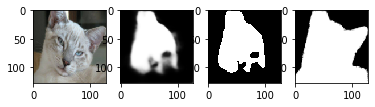

performance: 0.7294158935546875


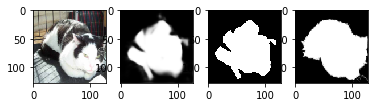

performance: 0.837125301361084


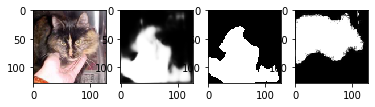

performance: 0.3724707365036011


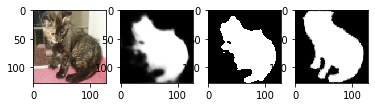

performance: 0.8833575248718262


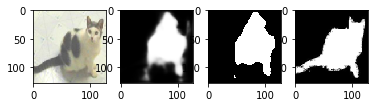

performance: 0.8091640472412109


In [0]:
unet_transfer_dog = UNet(3, 32)
unet_transfer_dog.load_state_dict(torch.load("/content/drive/My Drive/Colab Notebooks/transfer_model_dog.pth"))
unet_transfer_dog.to(cuda)
testResults(unet_transfer_dog, testloader, DiceLoss)

In [0]:
def transfer_learn(model_path, lr, epochs, unfreeze_layers):
  unet_transfer = UNet(3, 32)
  unet_transfer.load_state_dict(torch.load(model_path))

  for name, child in unet_transfer.named_children():
      if name in unfreeze_layers:
        for param in child.parameters():
              param.requires_grad = True
      else:
        for param in child.parameters():
          param.requires_grad = False

  torch.manual_seed(7)
  torch.cuda.manual_seed(7)

  unet_transfer = trainModel(unet_transfer, trainloader, testloader, lr, epochs, DiceLoss)

  return unet_transfer


Training loss 0 : 0.288055623571078
test set loss: 0.191112220287323
test set dice coefficient: 0.191112220287323


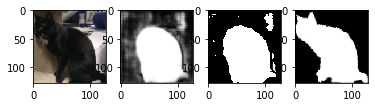

Training loss 1 : 0.249570079975658
test set loss: 0.2093643858319237
test set dice coefficient: 0.2093643858319237
Training loss 2 : 0.24274947245915732
test set loss: 0.1879318015916007
test set dice coefficient: 0.1879318015916007
Training loss 3 : 0.2399253033929401
test set loss: 0.19759052991867065
test set dice coefficient: 0.19759052991867065
Training loss 4 : 0.2377830578221215
test set loss: 0.20851095801308042
test set dice coefficient: 0.20851095801308042
Training loss 5 : 0.23547076516681248
test set loss: 0.20334939729599727
test set dice coefficient: 0.20334939729599727


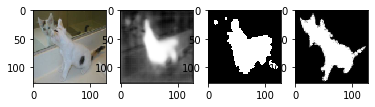

Training loss 6 : 0.23529523611068726
test set loss: 0.19727401506333125
test set dice coefficient: 0.19727401506333125
Training loss 7 : 0.23338755634095934
test set loss: 0.20789664416086107
test set dice coefficient: 0.20789664416086107
Training loss 8 : 0.23533321254783207
test set loss: 0.20231940632774717
test set dice coefficient: 0.20231940632774717
Training loss 9 : 0.23325050208303663
test set loss: 0.21580955244245983
test set dice coefficient: 0.21580955244245983
Training loss 10 : 0.2320530977514055
test set loss: 0.1924210332688831
test set dice coefficient: 0.1924210332688831


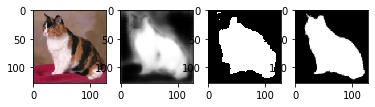

Training loss 11 : 0.22872386044926113
test set loss: 0.19821913753237044
test set dice coefficient: 0.19821913753237044
Training loss 12 : 0.23008445733123356
test set loss: 0.1914079473132179
test set dice coefficient: 0.1914079473132179
Training loss 13 : 0.23197147415743935
test set loss: 0.1937564810117086
test set dice coefficient: 0.1937564810117086
Training loss 14 : 0.2283715307712555
test set loss: 0.20507004998979114
test set dice coefficient: 0.20507004998979114
Training loss 15 : 0.23081244031588236
test set loss: 0.19528828916095553
test set dice coefficient: 0.19528828916095553


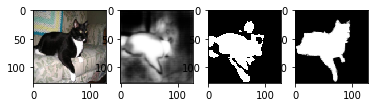

Training loss 16 : 0.23150805632273355
test set loss: 0.19498724880672635
test set dice coefficient: 0.19498724880672635
Training loss 17 : 0.22959592276149327
test set loss: 0.20114022493362427
test set dice coefficient: 0.20114022493362427
Training loss 18 : 0.22860409816106161
test set loss: 0.19371097144626437
test set dice coefficient: 0.19371097144626437
Training loss 19 : 0.22715729971726736
test set loss: 0.19945736726125082
test set dice coefficient: 0.19945736726125082
Training loss 20 : 0.2258564962281121
test set loss: 0.20560742276055471
test set dice coefficient: 0.20560742276055471


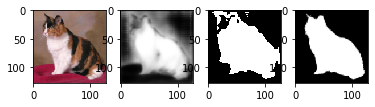

Training loss 21 : 0.22542808122105068
test set loss: 0.20106690838223412
test set dice coefficient: 0.20106690838223412
Training loss 22 : 0.2257336460881763
test set loss: 0.21620371512004308
test set dice coefficient: 0.21620371512004308
Training loss 23 : 0.22493616408771938
test set loss: 0.21511174951280868
test set dice coefficient: 0.21511174951280868
Training loss 24 : 0.22447519501050314
test set loss: 0.20839110442570277
test set dice coefficient: 0.20839110442570277
Training loss 25 : 0.22382187181048924
test set loss: 0.20381597394034975
test set dice coefficient: 0.20381597394034975


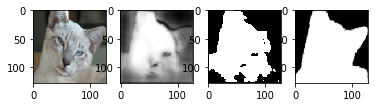

Training loss 26 : 0.22139942314889696
test set loss: 0.19809931232815697
test set dice coefficient: 0.19809931232815697
Training loss 27 : 0.22235669692357382
test set loss: 0.19960027365457444
test set dice coefficient: 0.19960027365457444
Training loss 28 : 0.22500875095526376
test set loss: 0.1964270756358192
test set dice coefficient: 0.1964270756358192
Training loss 29 : 0.22434639102882808
test set loss: 0.20741430634544009
test set dice coefficient: 0.20741430634544009
Training loss 30 : 0.22335563600063324
test set loss: 0.20320926677613033
test set dice coefficient: 0.20320926677613033


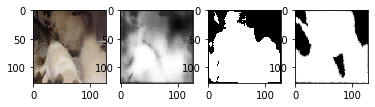

Training loss 31 : 0.22259598639276293
test set loss: 0.2035458485285441
test set dice coefficient: 0.2035458485285441
Training loss 32 : 0.22397299938731724
test set loss: 0.1969679934637887
test set dice coefficient: 0.1969679934637887
Training loss 33 : 0.2264377607239617
test set loss: 0.1959504002616519
test set dice coefficient: 0.1959504002616519
Training loss 34 : 0.21882578565014732
test set loss: 0.21128196659542264
test set dice coefficient: 0.21128196659542264
Training loss 35 : 0.22139809528986612
test set loss: 0.22537032479331606
test set dice coefficient: 0.22537032479331606


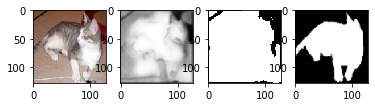

Training loss 36 : 0.22337997456391653
test set loss: 0.20079185281481063
test set dice coefficient: 0.20079185281481063
Training loss 37 : 0.2213822818464703
test set loss: 0.21188793863568986
test set dice coefficient: 0.21188793863568986
Training loss 38 : 0.22288760708438027
test set loss: 0.20256305024737403
test set dice coefficient: 0.20256305024737403
Training loss 39 : 0.2185840606689453
test set loss: 0.20333297763551986
test set dice coefficient: 0.20333297763551986
Training loss 40 : 0.22274135218726265
test set loss: 0.2118001182874044
test set dice coefficient: 0.2118001182874044


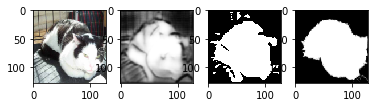

Training loss 41 : 0.22024360795815787
test set loss: 0.20842849072955905
test set dice coefficient: 0.20842849072955905
Training loss 42 : 0.2219636705186632
test set loss: 0.19559060675757273
test set dice coefficient: 0.19559060675757273
Training loss 43 : 0.22043764425648582
test set loss: 0.22551611491612025
test set dice coefficient: 0.22551611491612025
Training loss 44 : 0.2238826122548845
test set loss: 0.20455555121103922
test set dice coefficient: 0.20455555121103922
Training loss 45 : 0.22153809004359776
test set loss: 0.19232465539659774
test set dice coefficient: 0.19232465539659774


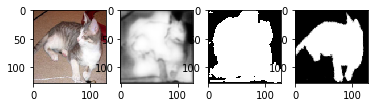

Training loss 46 : 0.2211651537153456
test set loss: 0.20142013969875516
test set dice coefficient: 0.20142013969875516
Training loss 47 : 0.21930150853263009
test set loss: 0.21002158380690075
test set dice coefficient: 0.21002158380690075
Training loss 48 : 0.21829203764597574
test set loss: 0.2034251860209874
test set dice coefficient: 0.2034251860209874
Training loss 49 : 0.21823929250240326
test set loss: 0.20328176873070852
test set dice coefficient: 0.20328176873070852
Training loss 50 : 0.21859093010425568
test set loss: 0.1980781526792617
test set dice coefficient: 0.1980781526792617


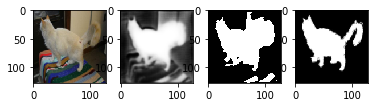

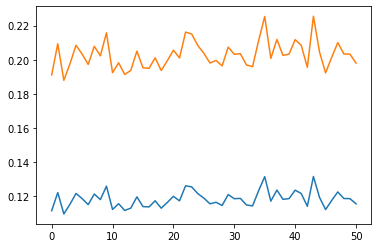

In [0]:
transfer_model = transfer_learn(
    "/content/drive/My Drive/Colab Notebooks/transfer_model_dog.pth", 
    0.0001, 
    41, 
    [
#     'convUp1', 
#     'convUp2', 
#     'convUp3', 
#     'convUp4', 
#     'up1', 
#     'up2', 
#     'up3', 
#     'up4', 
     'conv2L', 
     'output'])



In [0]:
torch.save(transfer_model.state_dict(), "/content/drive/My Drive/Colab Notebooks/transfer_model_relearned.pth")

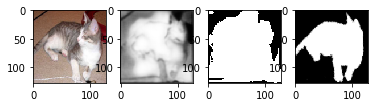

performance: 0.7443488836288452


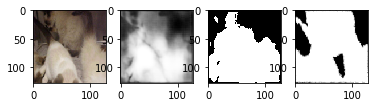

performance: 0.8596060872077942


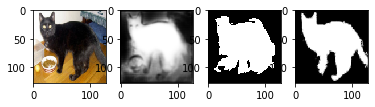

performance: 0.8762749433517456


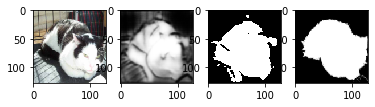

performance: 0.8708951473236084


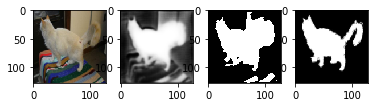

performance: 0.8122878670692444


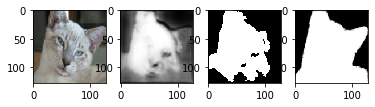

performance: 0.894599199295044


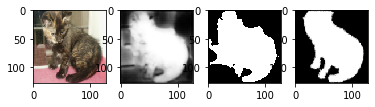

performance: 0.9047473073005676


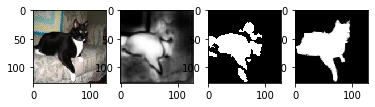

performance: 0.7659842371940613


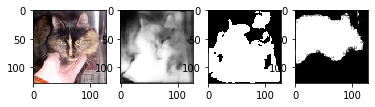

performance: 0.5767382383346558


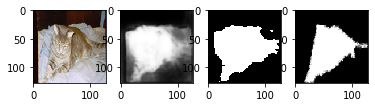

performance: 0.8564999103546143


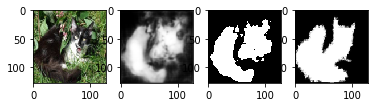

performance: 0.871838390827179


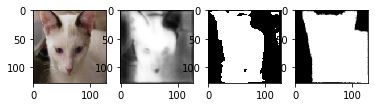

performance: 0.8607553839683533


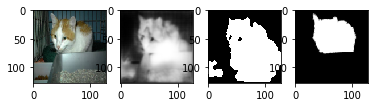

performance: 0.6238915920257568


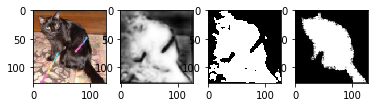

performance: 0.763062596321106


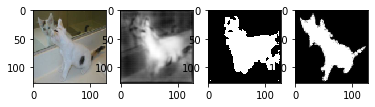

performance: 0.6866255402565002


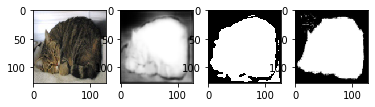

performance: 0.9382274150848389


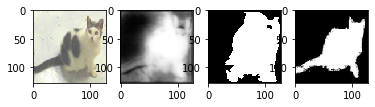

performance: 0.8019859194755554


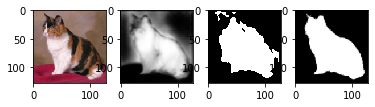

performance: 0.8809281587600708


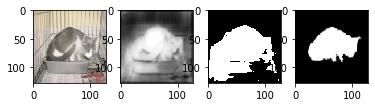

performance: 0.7038345336914062


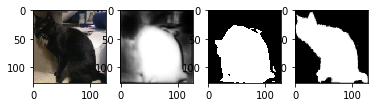

performance: 0.8425561785697937


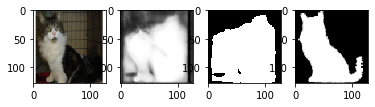

performance: 0.7046712636947632


In [0]:
testResults(transfer_model, testloader, DiceLoss)

# 1.4

In [0]:
def visualizeSegmentation(image, mask):
  edges = cv2.Canny(np.uint8(mask.cpu().data.numpy()[0, 0] * 255), 100, 200)
  _, contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  copyImage = (image.cpu().data.numpy()[0, 0] * 255).copy()
  cv2.drawContours(copyImage, contours, -1, (0, 255, 0), 2) 

  return copyImage

  
  

In [0]:
def visualizeSegmentationColor(image, mask):
  edges = cv2.Canny(np.uint8(mask.cpu().data.numpy()[0, 0] * 255), 100, 200)
  _, contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  copyImage = (image.permute(0, 2, 3, 1).cpu().data.numpy()).copy()

  if copyImage.shape[3] == 1:
    cv2.cvtColor(copyImage[0, :, :, 0], cv2.COLOR_GRAY2RGB)

  copyImage = copyImage[0] * 255


  cv2.drawContours(copyImage, contours, -1, (0, 255, 0), 1) 

  copyImage = copyImage.astype(int)

  copyImage = np.clip(copyImage, 0, 255)
  

  return copyImage
  

In [0]:
def visualizeTestSet(model, testloader):
  for index, data in enumerate(testloader):
    image = data['image'].float().to(cuda)
    mask = data['mask'].float().to(cuda)

    mask_pred = model(image)
    threshold = thresholdTensor(mask_pred)

    plt.imshow(visualizeSegmentationColor(image, threshold))
    plt.show()



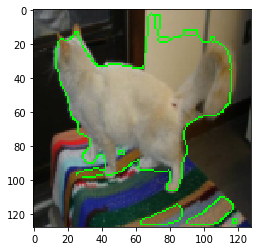

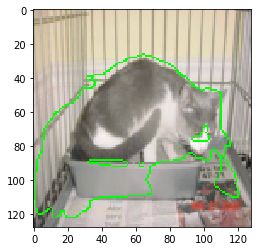

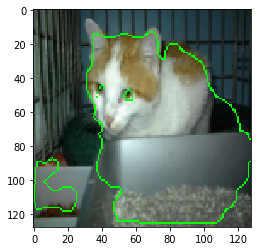

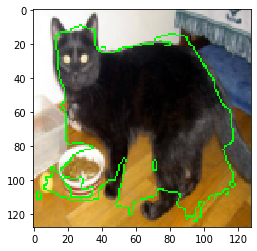

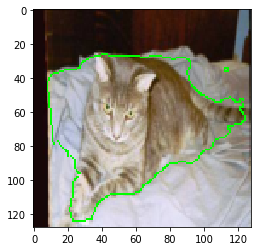

...

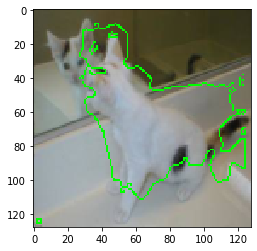

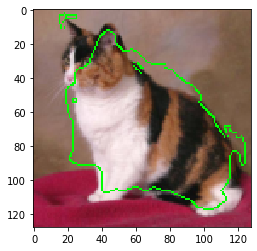

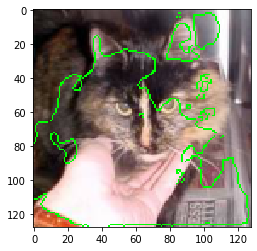

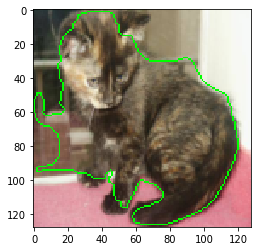

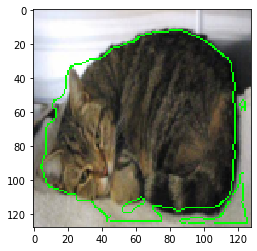

In [0]:
visualizeTestSet(transfer_model, testloader)

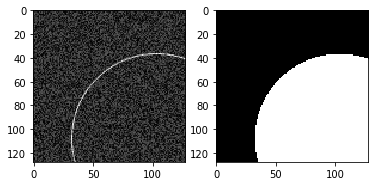

In [0]:
params, img = noisy_circle(128, 100, 0.5)

mask = np.zeros(img.shape)
draw_fill_circle(mask, params[0], params[1], params[2])

fig, ax = plt.subplots(1, 2)
ax[0].imshow(img.copy(), cmap='gray')
ax[1].imshow(mask, cmap='gray')
plt.show()



In [0]:
import numpy as np
from shapely.geometry.point import Point
from skimage.draw import circle_perimeter_aa, circle
import matplotlib.pyplot as plt


def draw_circle(img, row, col, rad):
    rr, cc, val = circle_perimeter_aa(row, col, rad)
    valid = (
        (rr >= 0) &
        (rr < img.shape[0]) &
        (cc >= 0) &
        (cc < img.shape[1])
    )
    img[rr[valid], cc[valid]] = val[valid]

def draw_fill_circle(img, row, col, rad):
    rr, cc = circle(row, col, rad)
    valid = (
        (rr >= 0) &
        (rr < img.shape[0]) &
        (cc >= 0) &
        (cc < img.shape[1])
    )
    img[rr[valid], cc[valid]] = 1


def noisy_circle(size, radius, noise):
    img = np.zeros((size, size), dtype=np.float)

    # Circle
    row = np.random.randint(size)
    col = np.random.randint(size)
    rad = np.random.randint(10, max(10, radius))
    draw_circle(img, row, col, rad)

    # Noise
    img += noise * np.random.rand(*img.shape)
    return (row, col, rad), img



In [0]:
class CircleData(Dataset):
  def __init__(self, dimensions, numData, transform=None):
    self.numData = numData
    self.dimensions = dimensions
    self.transform = transform
    self.storage = {}

  def __len__(self):
    return self.numData

  def __getitem__(self, idx):
    params, img = noisy_circle(self.dimensions, 50, 2)

    mask = np.zeros(img.shape)
    draw_fill_circle(mask, params[0], params[1], params[2])

    sample = {'image': np.expand_dims(img, axis=0), 'mask' : np.expand_dims(mask, axis=0)}

    if self.transform:
        sample = self.transform(sample)

    return sample

def Transform(sample):
  image = sample['image']
  mask = sample['mask']

  to_PIL = transforms.ToPILImage()
  image = to_PIL(image)
  mask = to_PIL(mask)

  #resize = transforms.Resize((128, 128))
  #image = resize(image)
  #mask = resize(mask)

  to_tensor = transforms.ToTensor()
  image = to_tensor(image)
  mask = to_tensor(mask)

  return {'image': image, 'mask' : mask}

In [0]:
circletrainDataSet = CircleData(128, 810)
circleTrainLoader = torch.utils.data.DataLoader(circletrainDataSet, batch_size=40, shuffle=True)

circletestDataSet = CircleData(128, 45)
circleTestLoader = torch.utils.data.DataLoader(circletestDataSet, batch_size=1, shuffle=True)

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Training loss 0 : 0.6363435699826195
test set loss: 0.6664784524175856
test set dice coefficient: 0.6664784524175856


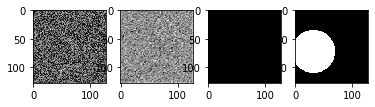

Training loss 1 : 0.632483646983192
Training loss 2 : 0.6169405466034299
test set loss: 0.6285788006252713
test set dice coefficient: 0.6285788006252713
Training loss 3 : 0.6260149365379697
Training loss 4 : 0.6213377629007611
test set loss: 0.692849318186442
test set dice coefficient: 0.692849318186442
Training loss 5 : 0.6233302695410592


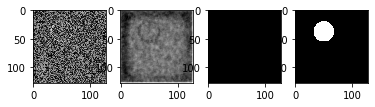

Training loss 6 : 0.6233310585930234
test set loss: 0.6799251861042447
test set dice coefficient: 0.6799251861042447
Training loss 7 : 0.6197228176253182
Training loss 8 : 0.6111368991079784
test set loss: 0.7011967963642545
test set dice coefficient: 0.7011967963642545
Training loss 9 : 0.6092962111745562
Training loss 10 : 0.6181555589040121
test set loss: 0.6641264650556776
test set dice coefficient: 0.6641264650556776


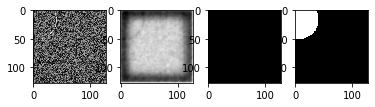

Training loss 11 : 0.6036790921574547
Training loss 12 : 0.6142811179161072
test set loss: 0.6958429839875963
test set dice coefficient: 0.6958429839875963
Training loss 13 : 0.6163445597603208
Training loss 14 : 0.6106444426945278
test set loss: 0.6698821981747946
test set dice coefficient: 0.6698821981747946
Training loss 15 : 0.6113709012667338


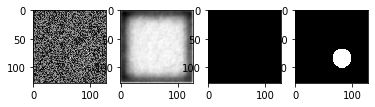

Training loss 16 : 0.61749039377485
test set loss: 0.6490223990546332
test set dice coefficient: 0.6490223990546332
Training loss 17 : 0.6135243943759373
Training loss 18 : 0.612881566796984
test set loss: 0.6657701081699795
test set dice coefficient: 0.6657701081699795
Training loss 19 : 0.6139221049490429
Training loss 20 : 0.6004731484821865
test set loss: 0.612495317724016
test set dice coefficient: 0.612495317724016


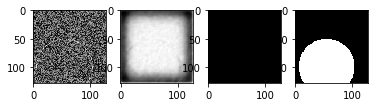

Training loss 21 : 0.6014008465267363
Training loss 22 : 0.6108477967126029
test set loss: 0.6333233859803942
test set dice coefficient: 0.6333233859803942
Training loss 23 : 0.6026255289713541
Training loss 24 : 0.6043913506326222
test set loss: 0.6486943787998624
test set dice coefficient: 0.6486943787998624
Training loss 25 : 0.6082375163123721


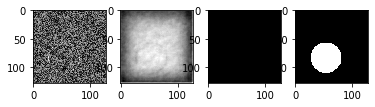

Training loss 26 : 0.6010942799704415
test set loss: 0.673884986506568
test set dice coefficient: 0.673884986506568
Training loss 27 : 0.6015745458148775
Training loss 28 : 0.5848322539102464
test set loss: 0.658629302183787
test set dice coefficient: 0.658629302183787
Training loss 29 : 0.5971945098468235
Training loss 30 : 0.587320157459804
test set loss: 0.6524984478950501
test set dice coefficient: 0.6524984478950501


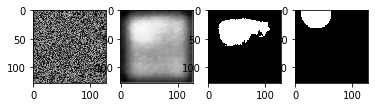

Training loss 31 : 0.6761644652911595
Training loss 32 : 0.6132643989154271
test set loss: 0.6698582794931199
test set dice coefficient: 0.6698582794931199
Training loss 33 : 0.593704430829911
Training loss 34 : 0.5604745177995591
test set loss: 0.6821441504690382
test set dice coefficient: 0.6821441504690382
Training loss 35 : 0.5450215623492286


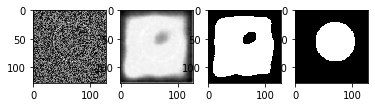

Training loss 36 : 0.4730328775587536
test set loss: 0.42553410132726033
test set dice coefficient: 0.42553410132726033
Training loss 37 : 0.4370088151523045
Training loss 38 : 0.42535801444734844
test set loss: 0.6074915991889106
test set dice coefficient: 0.6074915991889106
Training loss 39 : 0.46475309133529663
Training loss 40 : 0.3691995370955694
test set loss: 0.3783617536226908
test set dice coefficient: 0.3783617536226908


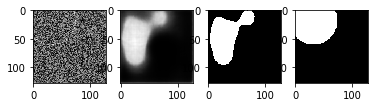

Training loss 41 : 0.3592863877614339
Training loss 42 : 0.31226452475502375
test set loss: 0.5562705371114943
test set dice coefficient: 0.5562705371114943
Training loss 43 : 0.35149779490062166
Training loss 44 : 0.27916546094985234
test set loss: 0.3841898838678996
test set dice coefficient: 0.3841898838678996
Training loss 45 : 0.2407205275126866


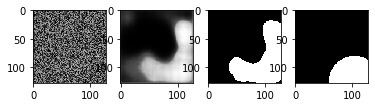

Training loss 46 : 0.3132137599445525
test set loss: 0.3230775343047248
test set dice coefficient: 0.3230775343047248
Training loss 47 : 0.19721811158316477
Training loss 48 : 0.1511657578604562
test set loss: 0.19341488679250082
test set dice coefficient: 0.19341488679250082
Training loss 49 : 0.13300571839014688
Training loss 50 : 0.10930541015806652
test set loss: 0.12482504977120293
test set dice coefficient: 0.12482504977120293


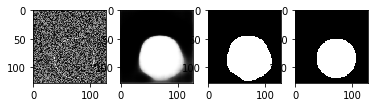

Training loss 51 : 0.09759396882284255
Training loss 52 : 0.09148252578008742
test set loss: 0.2575930608643426
test set dice coefficient: 0.2575930608643426
Training loss 53 : 0.07999103977566674
Training loss 54 : 0.062298275175548735
test set loss: 0.18086810774273343
test set dice coefficient: 0.18086810774273343
Training loss 55 : 0.05974394650686355


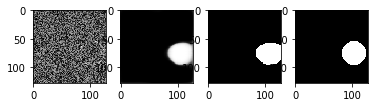

Training loss 56 : 0.06504399152029128
test set loss: 0.10978716479407416
test set dice coefficient: 0.10978716479407416
Training loss 57 : 0.056759014016106016
Training loss 58 : 0.050969467276618594
test set loss: 0.11372681856155395
test set dice coefficient: 0.11372681856155395
Training loss 59 : 0.043468781879970005
Training loss 60 : 0.042421775204794746
test set loss: 0.06509850952360365
test set dice coefficient: 0.06509850952360365


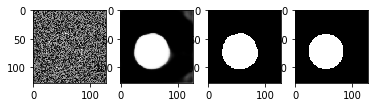

Training loss 61 : 0.03736775545846848
Training loss 62 : 0.03710938351494925
test set loss: 0.09900004201465183
test set dice coefficient: 0.09900004201465183
Training loss 63 : 0.03666161355518159
Training loss 64 : 0.03339155515034994
test set loss: 0.06427950594160292
test set dice coefficient: 0.06427950594160292
Training loss 65 : 0.03095122462227231


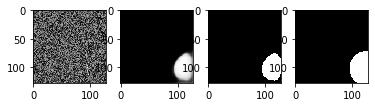

Training loss 66 : 0.027538753691173735
test set loss: 0.06123874187469482
test set dice coefficient: 0.06123874187469482
Training loss 67 : 0.02927287987300328
Training loss 68 : 0.028173997288658506
test set loss: 0.06322401099734837
test set dice coefficient: 0.06322401099734837
Training loss 69 : 0.02576802174250285
Training loss 70 : 0.02622264055978684
test set loss: 0.06414670546849568
test set dice coefficient: 0.06414670546849568


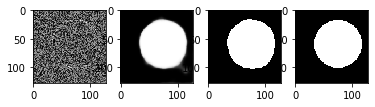

Training loss 71 : 0.024326324462890625
Training loss 72 : 0.027309119701385498
test set loss: 0.05464392238193088
test set dice coefficient: 0.05464392238193088
Training loss 73 : 0.02320222059885661
Training loss 74 : 0.023389041423797607
test set loss: 0.025163702170054116
test set dice coefficient: 0.025163702170054116
Training loss 75 : 0.021958302883874802


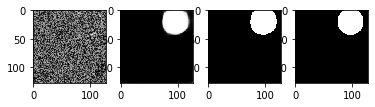

Training loss 76 : 0.024607703799293154
test set loss: 0.07494419813156128
test set dice coefficient: 0.07494419813156128
Training loss 77 : 0.04055825017747425
Training loss 78 : 0.02597835518064953
test set loss: 0.033159677187601724
test set dice coefficient: 0.033159677187601724
Training loss 79 : 0.02099902005422683
Training loss 80 : 0.019065382934751966
test set loss: 0.045595747894710964
test set dice coefficient: 0.045595747894710964


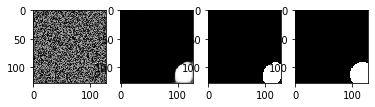

ValueError: ignored

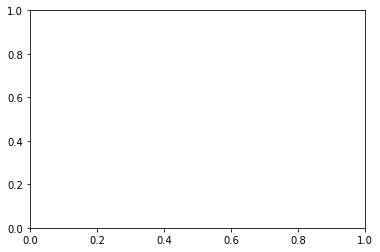

In [0]:
circleModel = UNet(1, 16)
#
#torch.manual_seed(12)
#torch.cuda.manual_seed(9)
#random.seed(2873)
circleModel = trainModel(circleModel, circleTrainLoader, circleTestLoader, 0.0001, 71, DiceLoss)


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
torch.save(circleModel.state_dict(), "/content/drive/My Drive/Colab Notebooks/circle_model_Dice2.pth")

In [0]:
circleModel = UNet(1, 16)
circleModel.load_state_dict(torch.load("/content/drive/My Drive/Colab Notebooks/circle_model_Dice.pth"))

circleModel.to(cuda)

UNet(
  (convDown1): Conv2Layer(
    (features): Sequential(
      (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (down): downSample(
    (features): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (convDown2): Conv2Layer(
    (features): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (convDown3): Conv2Layer(
    (features): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (convDown4

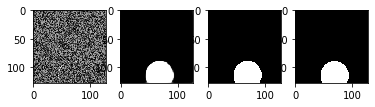

performance: 0.9935047030448914


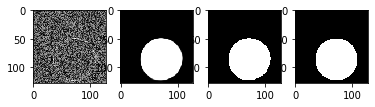

performance: 0.994871973991394


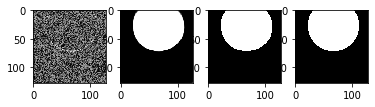

performance: 0.9948802590370178


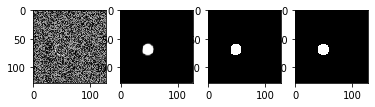

performance: 0.9652299284934998


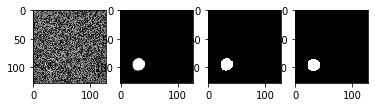

performance: 0.9643685817718506


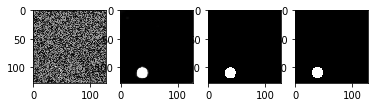

performance: 0.9634619951248169


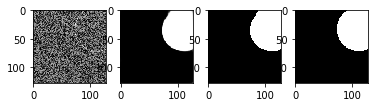

performance: 0.9941418170928955


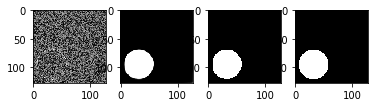

performance: 0.9905032515525818


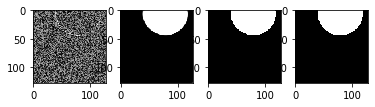

performance: 0.9965198040008545


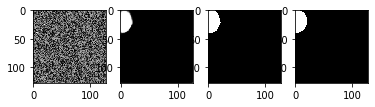

performance: 0.9864583015441895


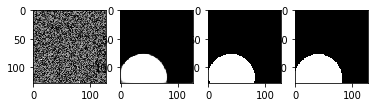

performance: 0.9943430423736572


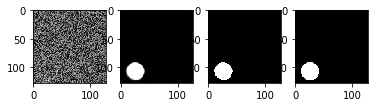

performance: 0.9800902009010315


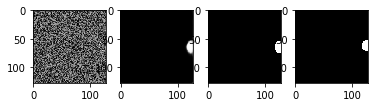

performance: 0.8902220129966736


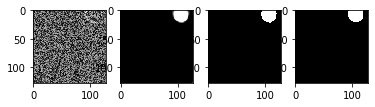

performance: 0.9829214811325073


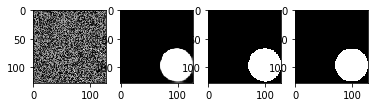

performance: 0.9912253618240356


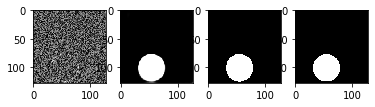

performance: 0.9908575415611267


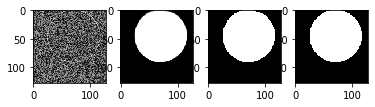

performance: 0.9960850477218628


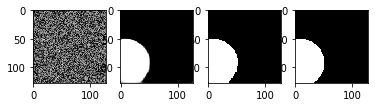

performance: 0.9930480122566223


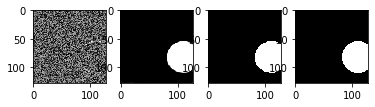

performance: 0.9955933690071106


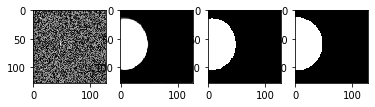

performance: 0.9908915162086487


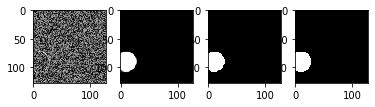

performance: 0.9905964136123657


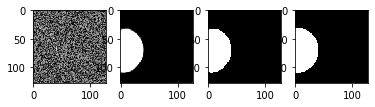

performance: 0.9920619130134583


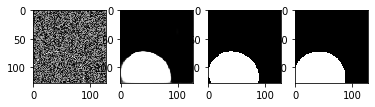

performance: 0.9900397062301636


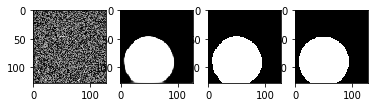

performance: 0.9924939274787903


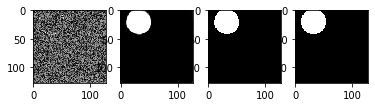

performance: 0.9888321161270142


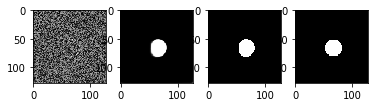

performance: 0.969310998916626


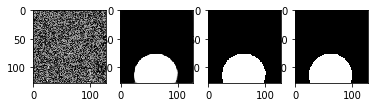

performance: 0.9945347905158997


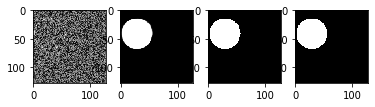

performance: 0.9929165840148926


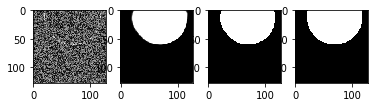

performance: 0.9934102892875671


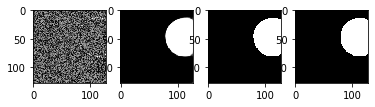

performance: 0.9956242442131042


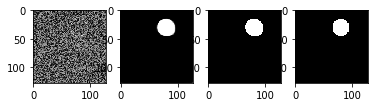

performance: 0.9635452032089233


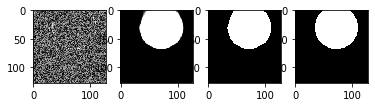

performance: 0.992979109287262


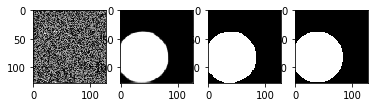

performance: 0.9934005737304688


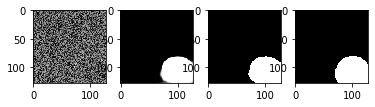

performance: 0.9875659942626953


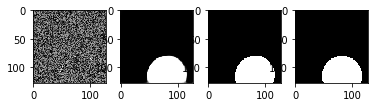

performance: 0.9939054250717163


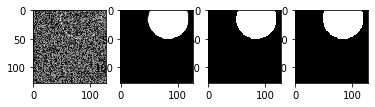

performance: 0.9963253140449524


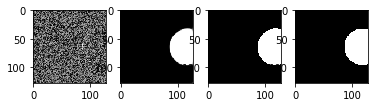

performance: 0.9922955632209778


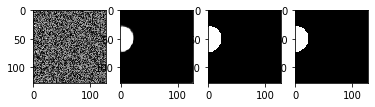

performance: 0.9896579384803772


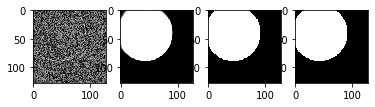

performance: 0.9958735108375549


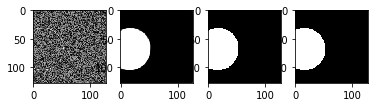

performance: 0.9949086904525757


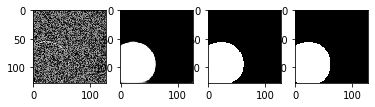

performance: 0.9959017038345337


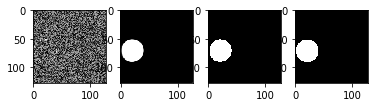

performance: 0.9855028986930847


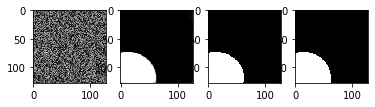

performance: 0.9961581230163574


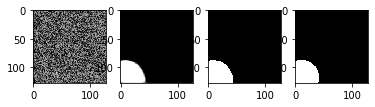

performance: 0.9844420552253723


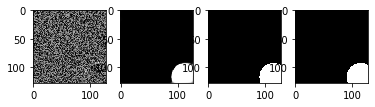

performance: 0.9938726425170898


In [0]:
testResults(circleModel, circleTestLoader, DiceLoss)

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [0]:

def transformImage(img):
  to_PIL = transforms.ToPILImage()
  image = to_PIL(img)

  resize = transforms.Resize((128, 128))
  image = resize(image)

  to_tensor = transforms.ToTensor()
  image = to_tensor(image)

  return image




def find_circle(img):
  x = transformImage(img.astype(np.float32))
  #model = UNet(1, 16)
  #model.load_state_dict(torch.load("/content/drive/My Drive/Colab Notebooks/circle_model_VeryNoisy.pth"))
  mask = circleModel(x.unsqueeze(0).float().to(cuda))
  mask = thresholdTensor(mask)


  #plt.imshow(mask[0, 0].cpu().data.numpy())
  #plt.show()

  mask_image = mask

  
  mask_image = torch.nn.functional.interpolate(mask_image, size=(200, 200))

  mask_image = mask_image[0, 0]

  sum0 = mask_image.sum((0))
  sum1 = mask_image.sum((1))

  row = sum1.argmax()
  col = sum0.argmax()

  #print(mask.shape, row, col)
  radrow = torch.tensor(0)
  radcol = torch.tensor(0)

  rowseq = (mask_image[row] == 1).nonzero()
  if rowseq.size()[0] >= 2:
    radrow = torch.max(torch.abs(rowseq[0] - col), torch.abs(rowseq[-1] - col))
  else:
    radrow = torch.max(torch.abs(torch.randint(0, 200, (1,)) - col), torch.abs(torch.randint(0, 200, (1,)) - col))

  colseq = (mask_image[:, col] == 1).nonzero()
  if colseq.size()[0] >= 2:
    radcol = torch.max(torch.abs(colseq[0] - row), torch.abs(colseq[-1] - row))
  else:
    radcol = torch.max(torch.abs(torch.randint(0, 200, (1,)) - col), torch.abs(torch.randint(0, 200, (1,)) - col))

  rad = torch.max(radrow.cpu(), radcol.cpu()).squeeze()

  #print(row.data.numpy(), col.data.numpy(), rad.data.numpy())
    
  #print(row, col, rad)

  return np.asscalar(row.data.numpy()), np.asscalar(col.data.numpy()), np.asscalar(rad.data.numpy())

def iou(params0, params1):
    row0, col0, rad0 = params0
    row1, col1, rad1 = params1

    shape0 = Point(row0, col0).buffer(rad0)
    shape1 = Point(row1, col1).buffer(rad1)

    return (
        shape0.intersection(shape1).area /
        shape0.union(shape1).area
    )


def main():
    results = []
    for _ in range(1000):
        params, img = noisy_circle(200, 50, 2)
        detected = find_circle(img)
        results.append(iou(params, detected))
    results = np.array(results)
    print((results > 0.7).mean()) 

In [0]:
main()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:63: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


0.31


In [0]:
def getIOUScore(numPics, threshold):

  circleModel = UNet(1, 16)
  circleModel.load_state_dict(torch.load("/content/drive/My Drive/Colab Notebooks/circle_model_Dice.pth"))
  circleModel.to(cuda)

  for _ in range(numPics):
    params, img = noisy_circle(200, 50, 2)
    detected = find_circle(img)

    img1 = np.zeros((200, 200))
    draw_circle(img1, params[0], params[1], params[2])

    m = iou(params, detected)

    if m > threshold:
      img2 = np.zeros((200, 200))
      draw_circle(img2, detected[0], detected[1], detected[2])
      print(params, detected)
      fig, ax = plt.subplots(1, 3)
      ax[0].imshow(img, cmap='gray')
      ax[1].imshow(img1, cmap='gray')
      ax[2].imshow(img2, cmap='gray')

      plt.show()
      print(f"IOU score: {m}")




In [26]:
getIOUScore(1000, 0.7)

Output hidden; open in https://colab.research.google.com to view.

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [0]:
circletrainDataSet2 = CircleData(128, 600)
circleTrainLoader2 = torch.utils.data.DataLoader(circletrainDataSet2, batch_size=10, shuffle=True)

circletestDataSet2 = CircleData(128, 20)
circleTestLoader2 = torch.utils.data.DataLoader(circletestDataSet2, batch_size=1, shuffle=True)

In [0]:
def IOULoss(pred, mask):
  smooth = 1

  intersection = (pred * mask).sum((2, 3)) + smooth

  union = pred.sum((2, 3)) + mask.sum((2, 3)) - intersection + smooth

  iou = (intersection / union).mean()

  return 1 - iou


Training loss 0 : 0.6329976220925649
test set loss: 0.6271229177713394
test set dice coefficient: 0.6271229177713394


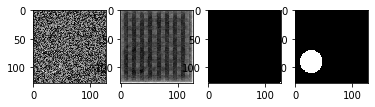

Training loss 1 : 0.6273017744223277
test set loss: 0.6986136794090271
test set dice coefficient: 0.6986136794090271
Training loss 2 : 0.6219020028909047
test set loss: 0.6880375534296036
test set dice coefficient: 0.6880375534296036
Training loss 3 : 0.6208448618650436
test set loss: 0.6840176284313202
test set dice coefficient: 0.6840176284313202
Training loss 4 : 0.624671553572019
test set loss: 0.6493646651506424
test set dice coefficient: 0.6493646651506424
Training loss 5 : 0.6144305835167567
test set loss: 0.7112231254577637
test set dice coefficient: 0.7112231254577637


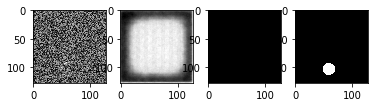

Training loss 6 : 0.6181690871715546
test set loss: 0.6083811163902283
test set dice coefficient: 0.6083811163902283
Training loss 7 : 0.6220111628373464
test set loss: 0.6515553563833236
test set dice coefficient: 0.6515553563833236
Training loss 8 : 0.6229397892951966
test set loss: 0.6205618590116501
test set dice coefficient: 0.6205618590116501
Training loss 9 : 0.6134450495243072
test set loss: 0.6660684764385223
test set dice coefficient: 0.6660684764385223
Training loss 10 : 0.6138052771488826
test set loss: 0.5858350604772568
test set dice coefficient: 0.5858350604772568


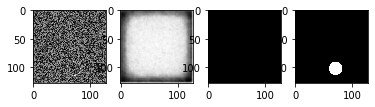

Training loss 11 : 0.6123948027690251
test set loss: 0.602598837018013
test set dice coefficient: 0.602598837018013
Training loss 12 : 0.6077980260054271
test set loss: 0.6766535073518753
test set dice coefficient: 0.6766535073518753
Training loss 13 : 0.6209348857402801
test set loss: 0.6253389358520508
test set dice coefficient: 0.6253389358520508
Training loss 14 : 0.6157237420479457
test set loss: 0.6914454370737075
test set dice coefficient: 0.6914454370737075
Training loss 15 : 0.6180854449669521
test set loss: 0.6821721285581589
test set dice coefficient: 0.6821721285581589


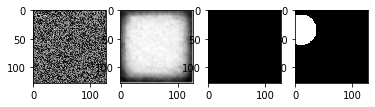

Training loss 16 : 0.6146900782982508
test set loss: 0.7179612994194031
test set dice coefficient: 0.7179612994194031
Training loss 17 : 0.6098392407099406
test set loss: 0.7096808731555939
test set dice coefficient: 0.7096808731555939
Training loss 18 : 0.6024882346391678
test set loss: 0.6562513679265976
test set dice coefficient: 0.6562513679265976
Training loss 19 : 0.6352752029895783
test set loss: 0.6309806734323502
test set dice coefficient: 0.6309806734323502
Training loss 20 : 0.6111427515745163
test set loss: 0.6553707122802734
test set dice coefficient: 0.6553707122802734


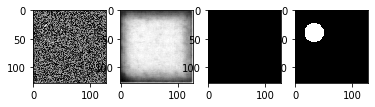

Training loss 21 : 0.6179286301136017
test set loss: 0.672199010848999
test set dice coefficient: 0.672199010848999
Training loss 22 : 0.6137244770924251
test set loss: 0.6296624451875686
test set dice coefficient: 0.6296624451875686
Training loss 23 : 0.5716438730557759
test set loss: 0.7029122292995453
test set dice coefficient: 0.7029122292995453
Training loss 24 : 0.6261527687311172
test set loss: 0.7166460275650024
test set dice coefficient: 0.7166460275650024
Training loss 25 : 0.6135512818892797
test set loss: 0.6732459008693695
test set dice coefficient: 0.6732459008693695


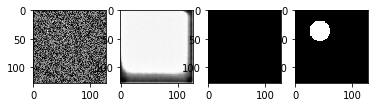

Training loss 26 : 0.6087929834922154
test set loss: 0.6618757337331772
test set dice coefficient: 0.6618757337331772
Training loss 27 : 0.6130467236042023
test set loss: 0.6517171680927276
test set dice coefficient: 0.6517171680927276
Training loss 28 : 0.5903551657994588
test set loss: 0.5987107336521149
test set dice coefficient: 0.5987107336521149
Training loss 29 : 0.4541497230529785
test set loss: 0.4175463169813156
test set dice coefficient: 0.4175463169813156
Training loss 30 : 0.36431457797686256
test set loss: 0.5343931823968887
test set dice coefficient: 0.5343931823968887


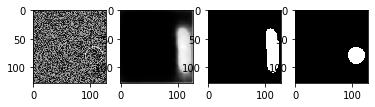

Training loss 31 : 0.3468174129724503
test set loss: 0.3285917967557907
test set dice coefficient: 0.3285917967557907
Training loss 32 : 0.31565335392951965
test set loss: 0.5237973272800446
test set dice coefficient: 0.5237973272800446
Training loss 33 : 0.2850094258785248
test set loss: 0.26964377164840697
test set dice coefficient: 0.26964377164840697
Training loss 34 : 0.17220643957455953
test set loss: 0.20637411773204803
test set dice coefficient: 0.20637411773204803
Training loss 35 : 0.12739739219347637
test set loss: 0.10914573967456817
test set dice coefficient: 0.10914573967456817


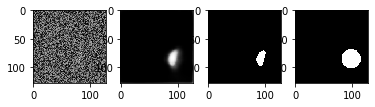

Training loss 36 : 0.08613345126310984
test set loss: 0.10754154026508331
test set dice coefficient: 0.10754154026508331
Training loss 37 : 0.08385459780693054
test set loss: 0.14398274421691895
test set dice coefficient: 0.14398274421691895
Training loss 38 : 0.05983186264832815
test set loss: 0.08329450190067292
test set dice coefficient: 0.08329450190067292
Training loss 39 : 0.05290778776009877
test set loss: 0.08892130553722381
test set dice coefficient: 0.08892130553722381
Training loss 40 : 0.034388386209805805
test set loss: 0.043849655985832216
test set dice coefficient: 0.043849655985832216


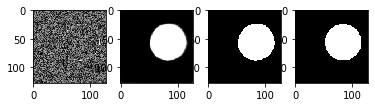

Training loss 41 : 0.04438485602537791
test set loss: 0.09216198921203614
test set dice coefficient: 0.09216198921203614
Training loss 42 : 0.03400658965110779
test set loss: 0.023088684678077696
test set dice coefficient: 0.023088684678077696
Training loss 43 : 0.030784493684768675
test set loss: 0.03226357698440552
test set dice coefficient: 0.03226357698440552
Training loss 44 : 0.025389252106348674
test set loss: 0.08077367246150971
test set dice coefficient: 0.08077367246150971
Training loss 45 : 0.022758041818936665
test set loss: 0.024450436234474182
test set dice coefficient: 0.024450436234474182


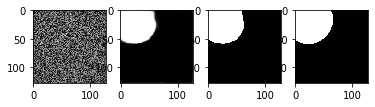

Training loss 46 : 0.02373016873995463
test set loss: 0.02071053385734558
test set dice coefficient: 0.02071053385734558
Training loss 47 : 0.031896424293518064
test set loss: 0.028090637922286988
test set dice coefficient: 0.028090637922286988
Training loss 48 : 0.022384467720985412
test set loss: 0.05105713903903961
test set dice coefficient: 0.05105713903903961
Training loss 49 : 0.023206072052319844
test set loss: 0.01953001320362091
test set dice coefficient: 0.01953001320362091
Training loss 50 : 0.026758829752604168
test set loss: 0.058984306454658506
test set dice coefficient: 0.058984306454658506


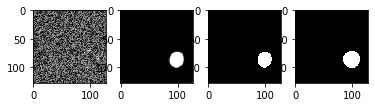

Training loss 51 : 0.0221198966105779
test set loss: 0.05957428514957428
test set dice coefficient: 0.05957428514957428
Training loss 52 : 0.025455603003501893
test set loss: 0.03049458861351013
test set dice coefficient: 0.03049458861351013
Training loss 53 : 0.0168935626745224
test set loss: 0.020182859897613526
test set dice coefficient: 0.020182859897613526
Training loss 54 : 0.016296706597010293
test set loss: 0.01625644266605377
test set dice coefficient: 0.01625644266605377
Training loss 55 : 0.016320237517356874
test set loss: 0.09600430428981781
test set dice coefficient: 0.09600430428981781


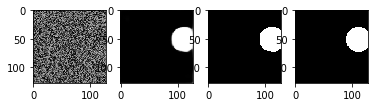

Training loss 56 : 0.016959686080614725
test set loss: 0.02268606722354889
test set dice coefficient: 0.02268606722354889
Training loss 57 : 0.015312301119168599
test set loss: 0.022939175367355347
test set dice coefficient: 0.022939175367355347
Training loss 58 : 0.016072392463684082
test set loss: 0.024789759516716005
test set dice coefficient: 0.024789759516716005
Training loss 59 : 0.034118367234865825
test set loss: 0.043774780631065366
test set dice coefficient: 0.043774780631065366
Training loss 60 : 0.015790187319119773
test set loss: 0.014868208765983581
test set dice coefficient: 0.014868208765983581


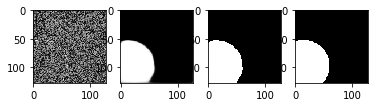

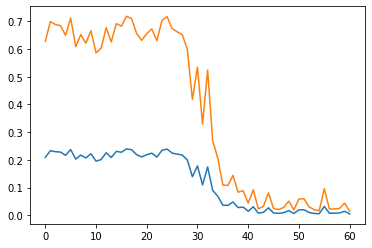

In [0]:
#torch.manual_seed(12)
#torch.cuda.manual_seed(654)
#random.seed(215)
circleModel_IOU = UNet(1, 16)

circleModel_IOU = trainModel(circleModel_IOU, circleTrainLoader2, circleTestLoader2, 0.0001, 61, IOULoss)


In [0]:
torch.save(circleModel_IOU.state_dict(), "/content/drive/My Drive/Colab Notebooks/circle_model_IOU.pth")

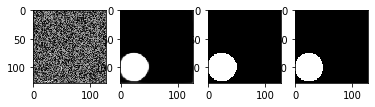

performance: 0.9342815279960632


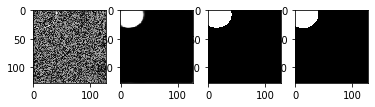

performance: 0.9345226883888245


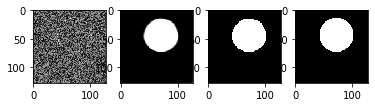

performance: 0.9422590136528015


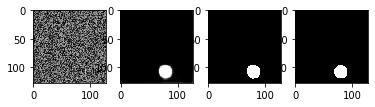

performance: 0.8217402696609497


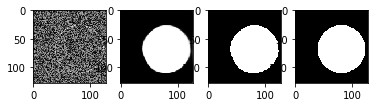

performance: 0.9670608043670654


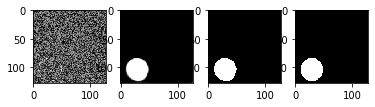

performance: 0.9172267317771912


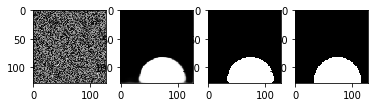

performance: 0.9600247740745544


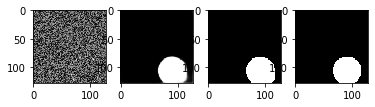

performance: 0.9144029021263123


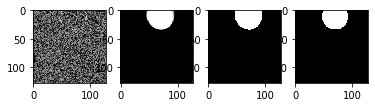

performance: 0.9263573288917542


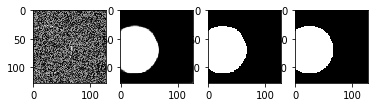

performance: 0.9754547476768494


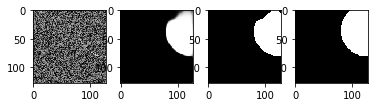

performance: 0.8922401666641235


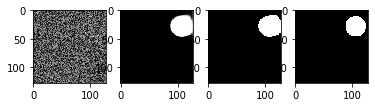

performance: 0.7810454964637756


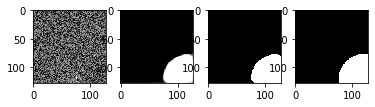

performance: 0.9572842717170715


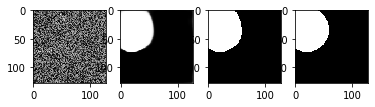

performance: 0.9543493390083313


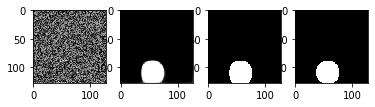

performance: 0.9189450740814209


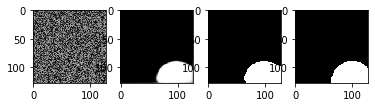

performance: 0.9411532282829285


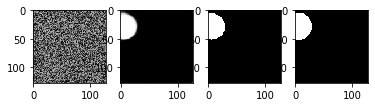

performance: 0.9018683433532715


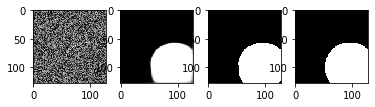

performance: 0.9678757190704346


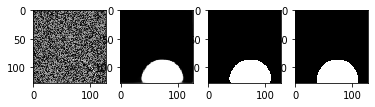

performance: 0.9571133852005005


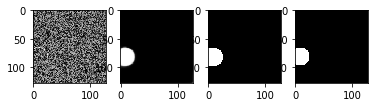

performance: 0.8791536688804626


In [0]:
testResults(circleModel_IOU, circleTestLoader2, IOULoss)

In [0]:

def visualizeSegmentationCircle(image, mask):
  edges = cv2.Canny(np.uint8(mask.cpu().data.numpy()[0, 0] * 255), 100, 200)
  _, contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  copyImage = (image.permute(0, 2, 3, 1).cpu().data.numpy()).copy().astype(np.float32)

  if copyImage.shape[3] == 1:
    copyImage = cv2.cvtColor(copyImage[0, :, :, 0], cv2.COLOR_GRAY2RGB)

  copyImage = copyImage * 255


  cv2.drawContours(copyImage, contours, -1, (0, 255, 0), 1) 

  copyImage = copyImage.astype(int)

  copyImage = np.clip(copyImage, 0, 255)
  

  return copyImage

In [23]:
circleModel = UNet(1, 16)
circleModel.load_state_dict(torch.load("/content/drive/My Drive/Colab Notebooks/circle_model_Dice.pth"))
circleModel.to(cuda) 


UNet(
  (convDown1): Conv2Layer(
    (features): Sequential(
      (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (down): downSample(
    (features): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (convDown2): Conv2Layer(
    (features): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (convDown3): Conv2Layer(
    (features): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (convDown4

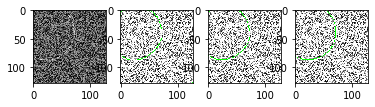

IOU : 0.9830870628356934


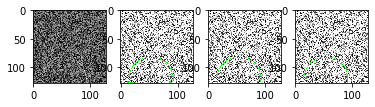

IOU : 0.9855967164039612


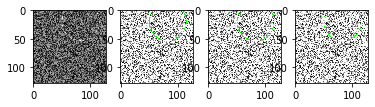

IOU : 0.9902389645576477


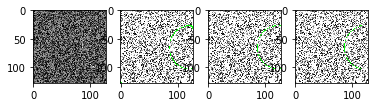

IOU : 0.989159882068634


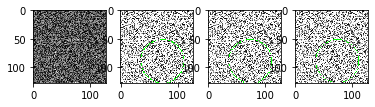

IOU : 0.9846457839012146


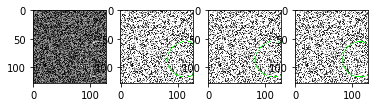

IOU : 0.979363739490509


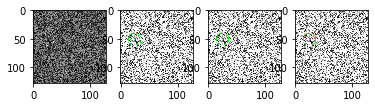

IOU : 0.9732620120048523


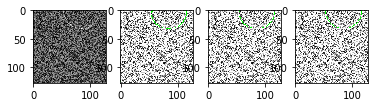

IOU : 0.9835966229438782


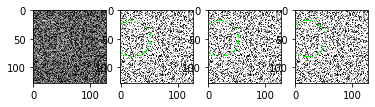

IOU : 0.9773972630500793


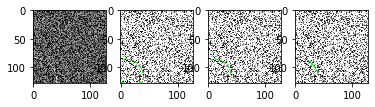

IOU : 0.9712606072425842


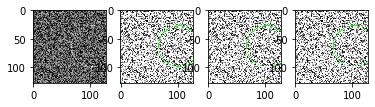

IOU : 0.9925783276557922


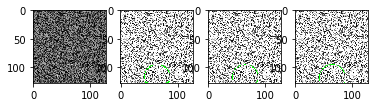

IOU : 0.9799839854240417


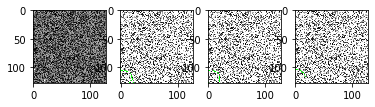

IOU : 0.8967136144638062


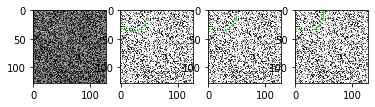

IOU : 0.987334132194519


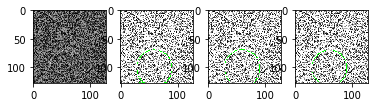

IOU : 0.9679786562919617


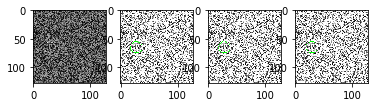

IOU : 0.8993902206420898


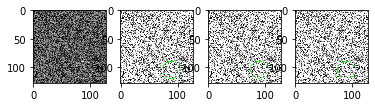

IOU : 0.9660537242889404


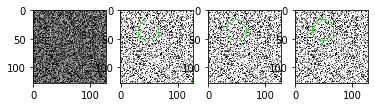

IOU : 0.946584939956665


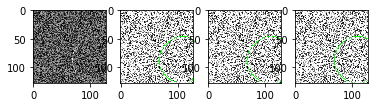

IOU : 0.985428512096405


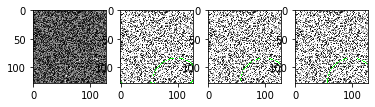

IOU : 0.9957935214042664


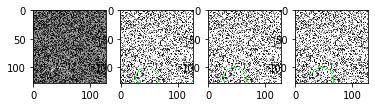

IOU : 0.9643979072570801


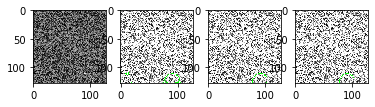

IOU : 0.9857142567634583


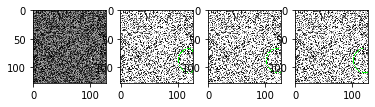

IOU : 0.9695320725440979


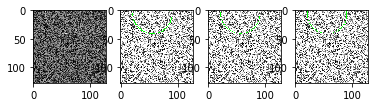

IOU : 0.9794204235076904


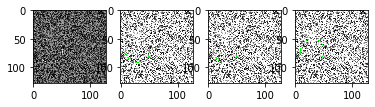

IOU : 0.9869281053543091


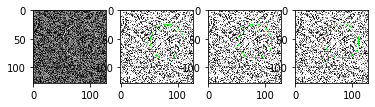

IOU : 0.9861848950386047


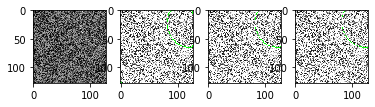

IOU : 0.9832944869995117


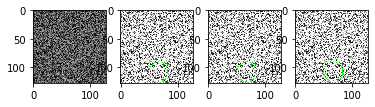

IOU : 0.9679203629493713


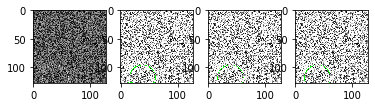

IOU : 0.9917287230491638


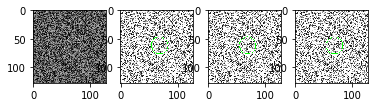

IOU : 0.9700854420661926


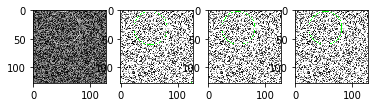

IOU : 0.9852719306945801


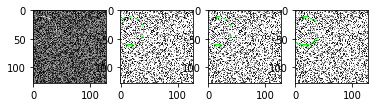

IOU : 0.985557496547699


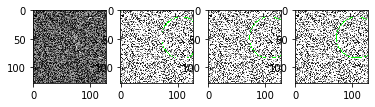

IOU : 0.984692394733429


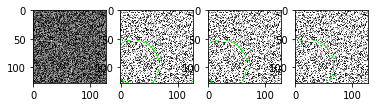

IOU : 0.9823797941207886


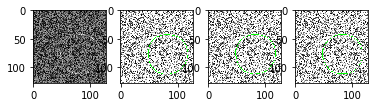

IOU : 0.9809131026268005


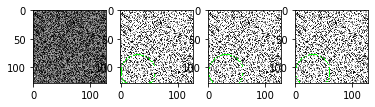

IOU : 0.9836913347244263


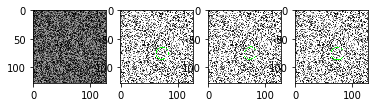

IOU : 0.9270833134651184


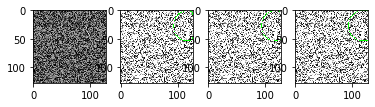

IOU : 0.9742765426635742


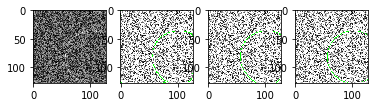

IOU : 0.984129786491394


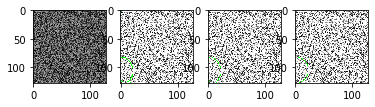

IOU : 0.9334862232208252


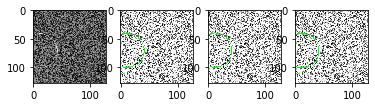

IOU : 0.988312304019928


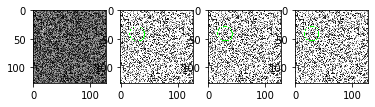

IOU : 0.9514925479888916


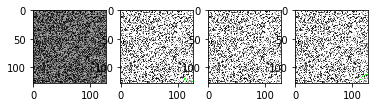

IOU : 0.0059171319007873535


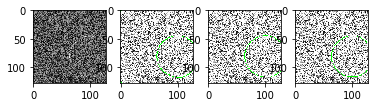

IOU : 0.9799635410308838


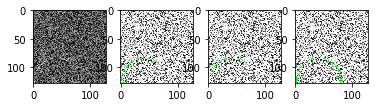

IOU : 0.9829833507537842
mean IOU: 0.9522401279873318


In [0]:

running_IOU = 0
for batch, data in enumerate(circleTestLoader):
  #testCircledata = next(iter(circleTestLoader))

  mask_pred = circleModel(data['image'].float().to(cuda))

  threshold = thresholdTensor(mask_pred)

  fig, ax = plt.subplots(1, 4)
  ax[0].imshow(data['image'].cpu().data.numpy()[0, 0], cmap='gray')
  ax[1].imshow(visualizeSegmentationCircle(data['image'], mask_pred))
  ax[2].imshow(visualizeSegmentationCircle(data['image'], thresholdTensor(mask_pred)))
  ax[3].imshow(visualizeSegmentationCircle(data['image'], data['mask']))

  plt.show()
  iou = (1 - IOULoss(threshold.float().to(cuda), data['mask'].float().to(cuda))).item()
  running_IOU += iou

  print(f"IOU : {iou}")

print(f"mean IOU: {running_IOU/len(circleTestLoader)}")


In [27]:
getIOUScore(50, 0)

Output hidden; open in https://colab.research.google.com to view.